In [ ]:
CIDADES = {
    "Touba": {
        "arquivo": "solar-measurementssenegal-toubaifcqc.csv",
        "tipo": "wb",
        "targets": ["dhi_rsi", "ghi_pyr", "ghi_sil"],
        "ignorar": ["dhi_rsi", "ghi_pyr", "ghi_sil"],
        "neurons": [[50, 50], [100, 200], [100, 50]],
        "dropouts": [[0.25, 0.25], [0.25, 0.25], [0, 0]],
        "epochs": [20, 40, 30],
        "batch_size": [128, 128, 128]
    },

    "Fatick": {
        "arquivo": "solar-measurementssenegal-fatickifcqc.csv",
        "tipo": "wb",
        "targets": ["dhi_rsi", "ghi_pyr", "ghi_sil"],
        "ignorar": ["dhi_rsi", "ghi_pyr", "ghi_sil"],
        "neurons": [[100, 50], [100, 50], [50, 50]],
        "dropouts": [[0.25, 0.25], [0.0, 0.25], [0.25, 0.25]],
        "epochs": [20, 50, 150],
        "batch_size": [128, 128, 128]
    },

    "SA Northern Cape": {
        "arquivo": "Timeseries_SA_northern_cape_2005_2016.csv",
        "tipo": "tmy",
        "targets": ["GSR"],
        "ignorar": ["GSR", "DSR"],
        "neurons": [[100, 50]],
        "dropouts": [[0, 0]],
        "epochs": [20],
        "batch_size": [512]
    },

    "CAR Vakaga": {
        "arquivo": "Timeseries_CAR_vakaga_2005_2016.csv",
        "tipo": "tmy",
        "targets": ["GSR"],
        "ignorar": ["GSR", "DSR"],
        "neurons": [[200, 200, 100]],
        "dropouts": [[0, 0, 0]],
        "epochs": [30],
        "batch_size": [512]
    },

    "Egypt Mut": {
        "arquivo": "Timeseries_egypt_mut_2005_2016.csv",
        "tipo": "tmy",
        "targets": ["GSR"],
        "ignorar": ["GSR", "DSR"],
        "neurons": [[200, 200, 100]],
        "dropouts": [[0, 0, 0]],
        "epochs": [7],
        "batch_size": [128]
    },

    "Algeria Tamanrasset": {
        "arquivo": "Timeseries_tamaransset_2005_2016.csv",
        "tipo": "tmy",
        "targets": ["GSR"],
        "ignorar": ["GSR", "DSR"],
        "neurons": [[100, 100, 50]],
        "dropouts": [[0, 0, 0]],
        "epochs": [100],
        "batch_size": [512]
    },

    "Nigeria Borno": {
        "arquivo": "Timeseries_nigeria_borno_2005_2016.csv",
        "tipo": "tmy",
        "targets": ["DSR"],
        "ignorar": ["GSR", "DSR"],
        "neurons": [[100, 50]],
        "dropouts": [[0, 0]],
        "epochs": [50],
        "batch_size": [512]
    },

    "Nigeria Abuja": {
        "arquivo": "SARAH_nigeria_abuja.csv",
        "tipo": "sarah",
        "targets": ["DNI"],
        "ignorar": ["DNI"],
        "neurons": [[200, 200, 50]],
        "dropouts": [[0, 0, 0]],
        "epochs": [100],
        "batch_size": [128]
    },

    "Nigeria Akure": {
        "arquivo": "SARAH_nigeria_akure.csv",
        "tipo": "sarah",
        "targets": ["DNI"],
        "ignorar": ["DNI"],
        "neurons": [[200, 200, 100]],
        "dropouts": [[0, 0, 0]],
        "epochs": [100],
        "batch_size": [128]
    }
}

OTIMIZADORES = ["adam", "sgd"]

LRS = [1e-3, 5e-4, 1e-4]


In [ ]:
def carregar_wb(path):
    df = pd.read_csv(path, sep=';')
    df['time'] = pd.to_datetime(df['time'])

    df['year'] = df['time'].dt.year
    df['month'] = df['time'].dt.month
    df['day'] = df['time'].dt.day
    df['hour'] = df['time'].dt.hour
    df['minute'] = df['time'].dt.minute

    df.drop(columns=['time', 'comments'], inplace=True)

    return df[
        ['year','month','day','hour','minute','air_temperature',
         'relative_humidity','wind_speed','wind_from_direction',
         'wind_speed_calc','sensor_cleaning','precipitation',
         'barometric_pressure','dhi_rsi','ghi_sil','ghi_pyr']
    ]


In [ ]:
import pandas as pd

In [ ]:
def carregar_tmy(path):
    df = pd.read_csv(
        path, sep=',', skiprows=8, skipfooter=12, engine='python'
    )

    df['time'] = pd.to_datetime(df['time'], format="%Y%m%d:%H%M")

    df['year'] = df['time'].dt.year
    df['month'] = df['time'].dt.month
    df['day'] = df['time'].dt.day
    df['hour'] = df['time'].dt.hour

    df.drop(columns=['time','Int','Gr(i)'], inplace=True)

    df = df.rename(columns={ 'Gb(i)': 'GSR', 'Gd(i)': 'DSR' })

    return df[['year','month','day','hour','H_sun','T2m','WS10m','GSR','DSR']]


In [ ]:
def carregar_sarah(path):
  df = pd.read_csv(path, sep=';')

  df['time'] = pd.to_datetime(df['time'], format="%d/%m/%Y")

  df['year'] = df['time'].dt.year
  df['month'] = df['time'].dt.month
  df['day'] = df['time'].dt.day

  df.drop(columns=['time'], inplace=True)

  return df[['year','month','day','SDU','DNI']]


In [ ]:
def carregar_dataframe(cidade, config):
    if config["tipo"] == "wb":
        return carregar_wb(config["arquivo"])
    elif config["tipo"] == "tmy":
        return carregar_tmy(config["arquivo"])
    elif config["tipo"] == "sarah":
      return carregar_sarah(config["arquivo"])

In [ ]:
import torch
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler

In [ ]:
def criar_loaders(df, target, ignorar, batch_size):
    X = df.drop(columns=ignorar).values
    y = df[target].values.reshape(-1, 1)

    scaler_X = StandardScaler()
    scaler_y = StandardScaler()

    X = scaler_X.fit_transform(X)
    y = scaler_y.fit_transform(y)

    n = len(df)
    t = int(0.9 * n)

    X_train = torch.tensor(X[:t], dtype=torch.float32)
    y_train = torch.tensor(y[:t], dtype=torch.float32)
    X_test  = torch.tensor(X[t:], dtype=torch.float32)
    y_test  = torch.tensor(y[t:], dtype=torch.float32)

    train_loader = DataLoader(
        TensorDataset(X_train, y_train),
        batch_size=batch_size,
        shuffle=False # Séries temporais não usam Shuffle (aparentemente)
    )

    test_loader = DataLoader(
        TensorDataset(X_test, y_test),
        batch_size=batch_size,
        shuffle=False
    )

    return train_loader, test_loader, X_train.shape[1], scaler_y


In [ ]:
import torch.nn as nn

class Model(nn.Module):
    def __init__(self, num_features, num_outputs, neurons, dropouts):
        super().__init__()

        layers = []
        in_f = num_features

        for out_f, drop in zip(neurons, dropouts):
            layers.append(nn.Linear(in_f, out_f))
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(drop))
            in_f = out_f

        layers.append(nn.Linear(in_f, num_outputs))

        self.rede = nn.Sequential(*layers)

    def forward(self, x):
        return self.rede(x)


In [ ]:
models_data = []

for cidade, cfg in CIDADES.items():

    df = carregar_dataframe(cidade, cfg)
    df = df.dropna()

    for idx, target in enumerate(cfg["targets"]):

        train_loader, test_loader, n_features, scaler_y = criar_loaders(
            df,
            target,
            cfg["ignorar"],
            cfg["batch_size"][idx]
        )

        params = {
            "neurons": cfg["neurons"][idx],
            "dropouts": cfg["dropouts"][idx],
            "epochs": cfg["epochs"][idx]
        }

        models_data.append({
            "tipo": cfg['tipo'],
            "cidade": cidade,
            "target": target,
            "qnt_features": n_features,
            "train_loader": train_loader,
            "test_loader": test_loader,
            "scaler_y": scaler_y,
            "params": params
        })


/tmp/ipython-input-1921294753.py:2: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(path, sep=';')
/tmp/ipython-input-1921294753.py:2: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(path, sep=';')


In [ ]:
import torch
import numpy as np
import os

In [ ]:
os.makedirs("output", exist_ok=True)

for md in models_data:
  for opt_name in OTIMIZADORES:
      for lr in LRS:

        model = Model(
            num_features=md["qnt_features"],
            num_outputs=1,
            neurons=md["params"]["neurons"],
            dropouts=md["params"]["dropouts"]
        )

        criterio = nn.MSELoss()

        if opt_name == "adam":
          opt = torch.optim.Adam(
              model.parameters(),
              lr=lr
          )
        elif opt_name == "sgd":
            opt = torch.optim.SGD(
                model.parameters(),
                lr=lr,
                momentum=0.9,
                weight_decay=1e-4
            )

        best_loss = np.inf
        best_state = None

        print(f"\nTreinando {md['cidade']} - {md['target']} | opt={opt_name} | lr={lr}")


        epochs = md["params"]["epochs"]
        for epoch in range(epochs):

            epoch_loss = 0
            for Xb, yb in md["train_loader"]:

                pred = model(Xb)
                loss = criterio(pred, yb)

                opt.zero_grad()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0) # para SGD apenas
                opt.step()

                epoch_loss += loss.item()

            epoch_loss /= len(md["train_loader"])
            print(f"Epoch {epoch+1}/{epochs} | Loss: {epoch_loss:.4f}")

            if epoch_loss < best_loss:
                best_loss = epoch_loss
                best_state = model.state_dict()

        torch.save(best_state, f"output/{md['cidade']}_{md['target']}_{opt_name}_{lr}.pth")



Treinando Touba - dhi_rsi | opt=adam | lr=0.001
Epoch 1/20 | Loss: 0.3367
Epoch 2/20 | Loss: 0.2167
Epoch 3/20 | Loss: 0.1944
Epoch 4/20 | Loss: 0.1881
Epoch 5/20 | Loss: 0.1838
Epoch 6/20 | Loss: 0.1809
Epoch 7/20 | Loss: 0.1799
Epoch 8/20 | Loss: 0.1770
Epoch 9/20 | Loss: 0.1751
Epoch 10/20 | Loss: 0.1748
Epoch 11/20 | Loss: 0.1740
Epoch 12/20 | Loss: 0.1730
Epoch 13/20 | Loss: 0.1723
Epoch 14/20 | Loss: 0.1706
Epoch 15/20 | Loss: 0.1701
Epoch 16/20 | Loss: 0.1686
Epoch 17/20 | Loss: 0.1688
Epoch 18/20 | Loss: 0.1668
Epoch 19/20 | Loss: 0.1661
Epoch 20/20 | Loss: 0.1660

Treinando Touba - dhi_rsi | opt=adam | lr=0.0005
Epoch 1/20 | Loss: 0.4087
Epoch 2/20 | Loss: 0.2448
Epoch 3/20 | Loss: 0.2045
Epoch 4/20 | Loss: 0.1895
Epoch 5/20 | Loss: 0.1824
Epoch 6/20 | Loss: 0.1773
Epoch 7/20 | Loss: 0.1741
Epoch 8/20 | Loss: 0.1712
Epoch 9/20 | Loss: 0.1693
Epoch 10/20 | Loss: 0.1678
Epoch 11/20 | Loss: 0.1662
Epoch 12/20 | Loss: 0.1650
Epoch 13/20 | Loss: 0.1647
Epoch 14/20 | Loss: 0.1638
E

In [ ]:
import matplotlib.pyplot as plt

def criar_plot(reals, preds, intervalo, xlabel, ylabel, marker, mdl, opt_name, lr):

  plt.figure(figsize=(12, 5))

  if marker:
    plt.plot(intervalo, reals, label="Real Data", linewidth=0.9, color='black', marker='o')
    plt.plot(intervalo, preds, label="Predição", linewidth=0.9, color='red', marker='+')
  else:
    plt.plot(intervalo, reals, label="Real Data", linewidth=0.9, color='black')
    plt.plot(intervalo, preds, label="Predição", linewidth=0.9, color='red')

  plt.xlabel(xlabel)
  plt.ylabel(ylabel)
  plt.title("Real vs Predicted")
  plt.grid(True, alpha=0.3)
  plt.legend()
  plt.tight_layout()

  os.makedirs('output_plots', exist_ok=True)
  save_path = os.path.join('output_plots', f"{mdl['cidade']}_{mdl['target']}_{opt_name}_{lr}.png")
  plt.savefig(save_path, dpi=300, bbox_inches='tight')

  plt.show()
  plt.close()

Touba dhi_rsi adam 0.001 :  40.46684646606445 70.78860337079338 0.8516012660906782


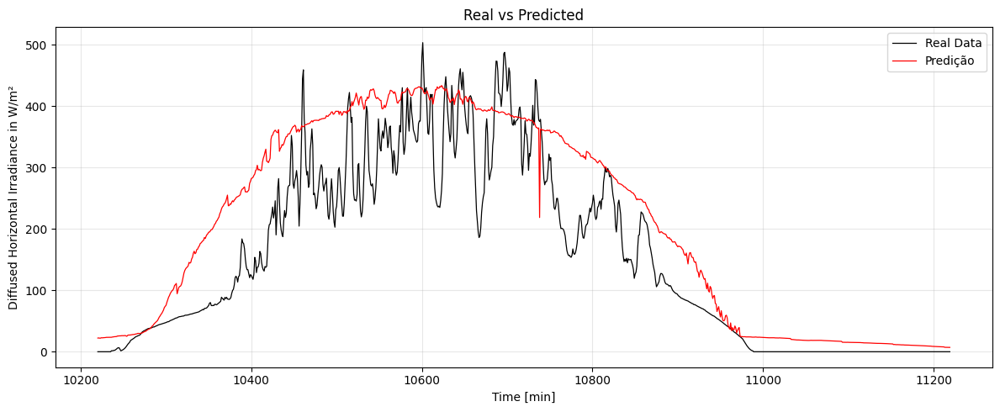

Touba dhi_rsi adam 0.0005 :  37.23970413208008 68.36215887188614 0.8509832286364271


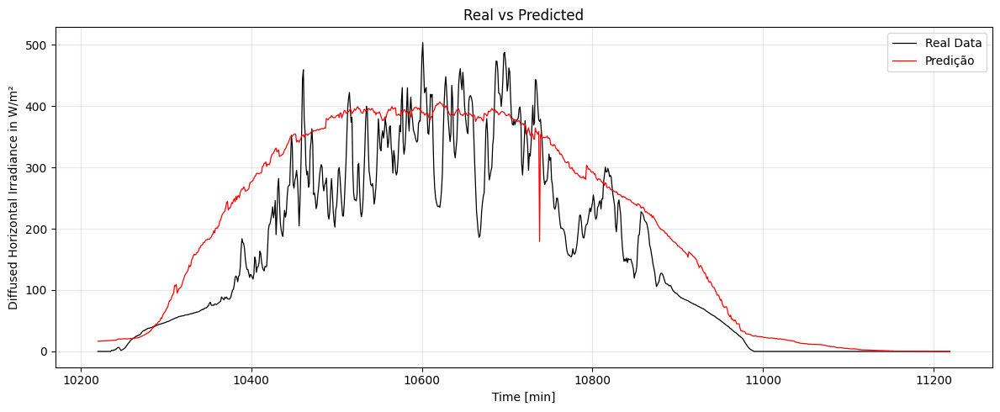

Touba dhi_rsi adam 0.0001 :  39.199974060058594 69.29568241645723 0.8486710743557299


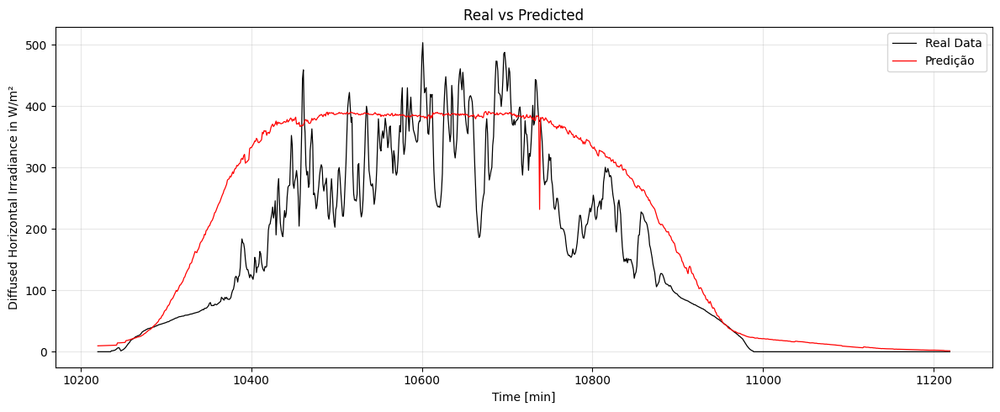

Touba dhi_rsi sgd 0.001 :  39.304481506347656 68.74062791232889 0.853874849156235


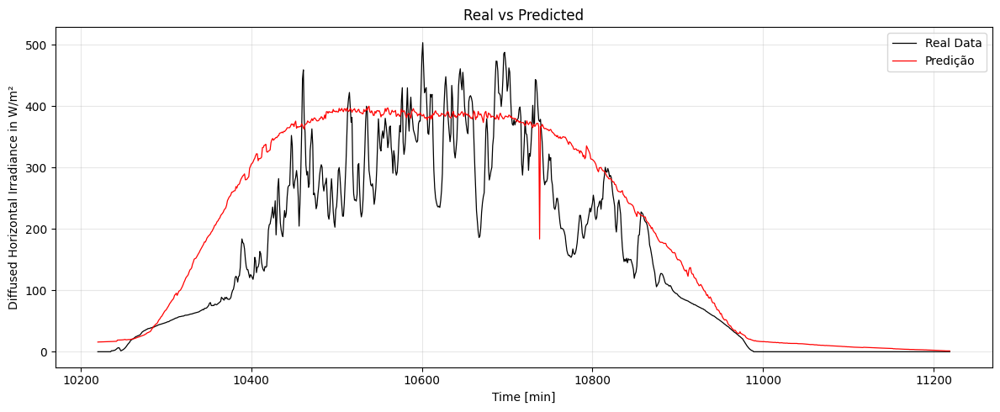

Touba dhi_rsi sgd 0.0005 :  41.51026916503906 69.40955290992912 0.8449468127759563


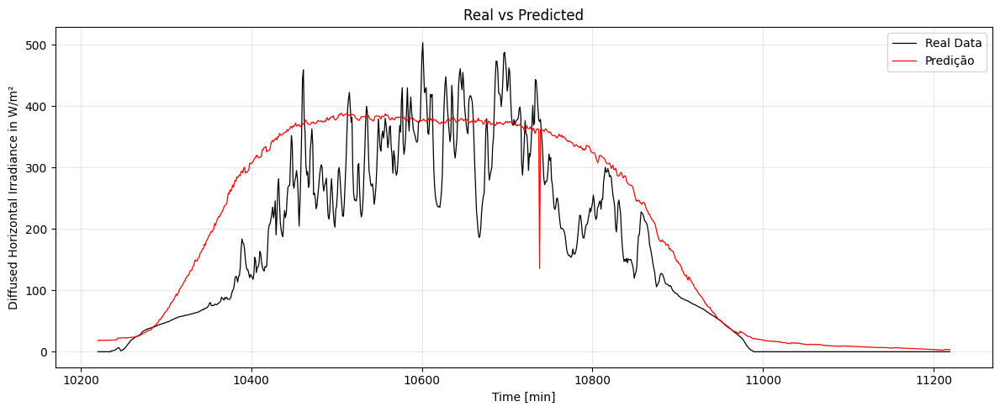

Touba dhi_rsi sgd 0.0001 :  57.386722564697266 95.52798387449093 0.7625922905432998


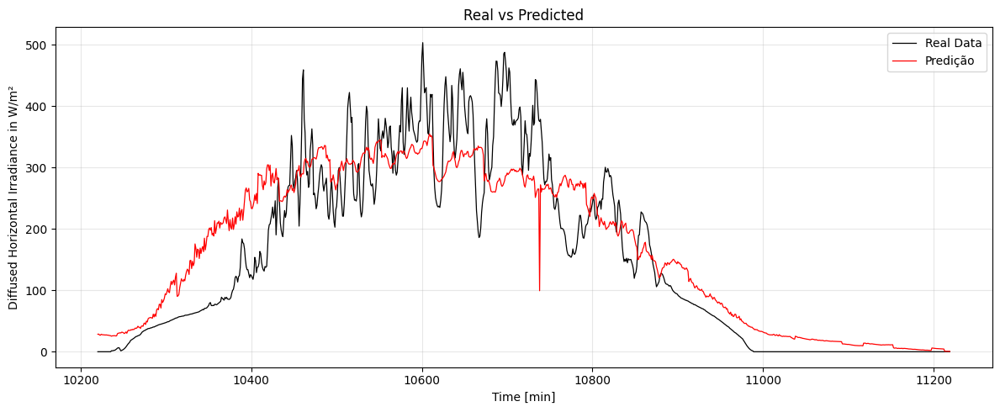

Touba ghi_pyr adam 0.001 :  64.1665267944336 107.58977900746427 0.9080177777555956


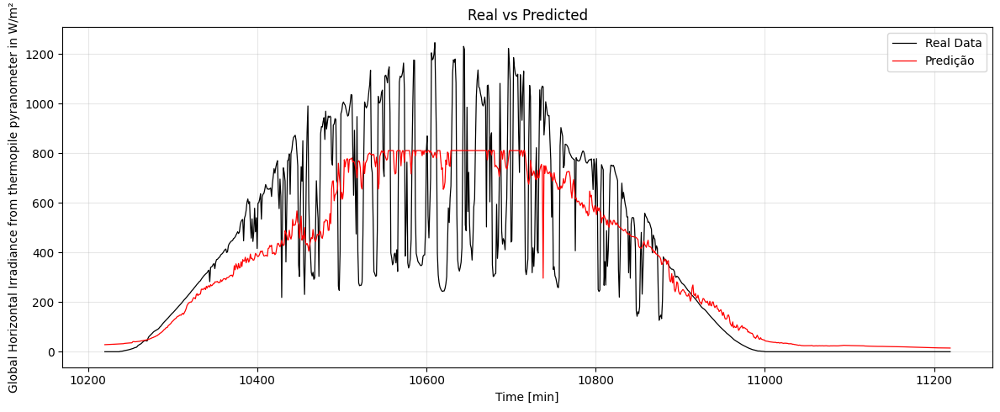

Touba ghi_pyr adam 0.0005 :  63.5071907043457 109.21296032580108 0.905004068615989


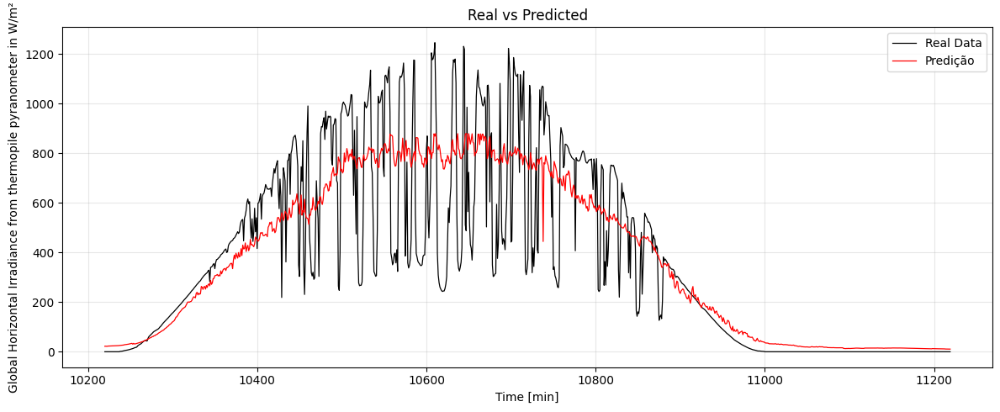

Touba ghi_pyr adam 0.0001 :  58.70024871826172 100.42756251398318 0.9149811249418603


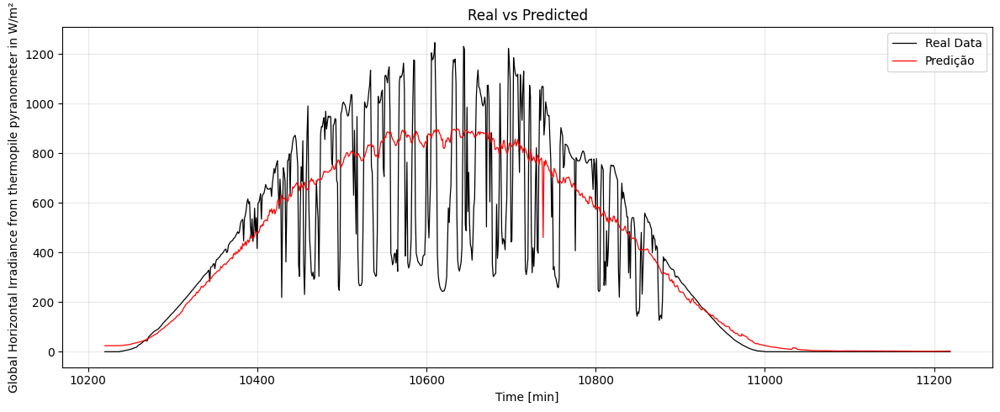

Touba ghi_pyr sgd 0.001 :  62.33293914794922 102.09104296992709 0.9138306371708754


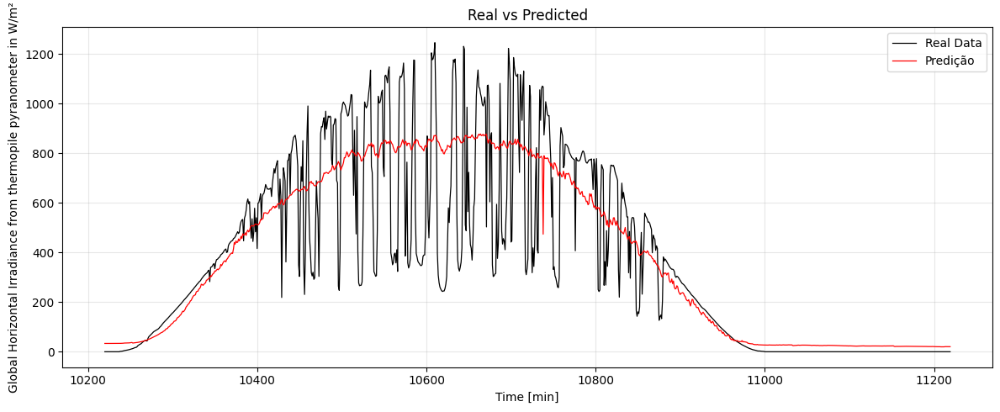

Touba ghi_pyr sgd 0.0005 :  59.36604309082031 101.20580150274242 0.9145359548598194


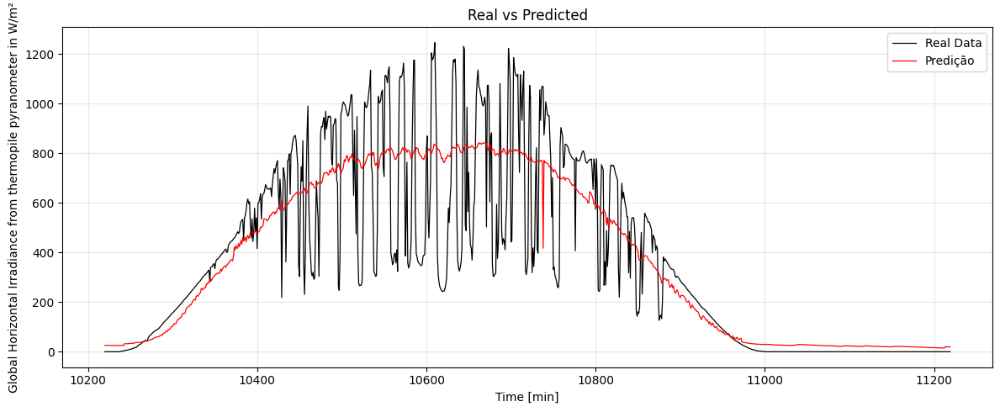

Touba ghi_pyr sgd 0.0001 :  75.8603286743164 120.02903294620015 0.8954930405518402


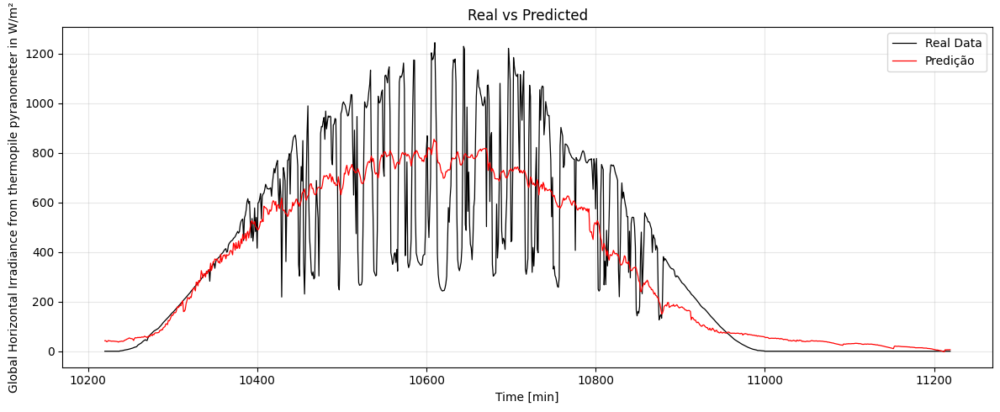

Touba ghi_sil adam 0.001 :  55.19380187988281 99.06149447439202 0.9114085102086869


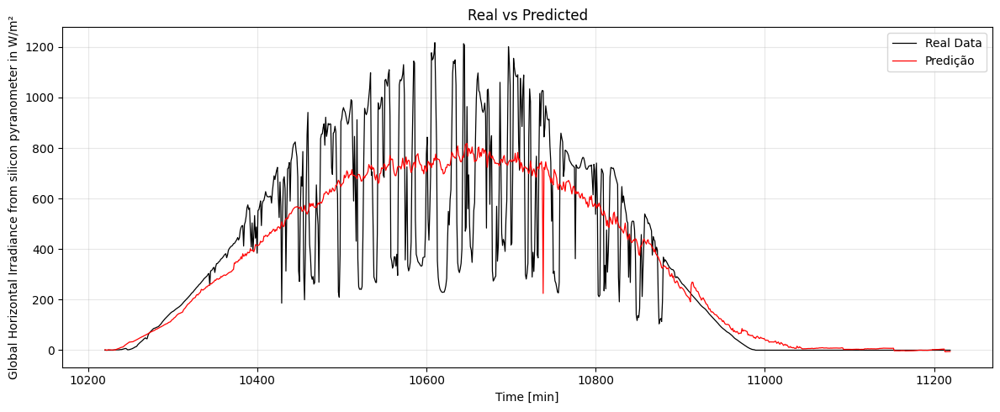

Touba ghi_sil adam 0.0005 :  55.97473907470703 98.43971227672803 0.9093244719048782


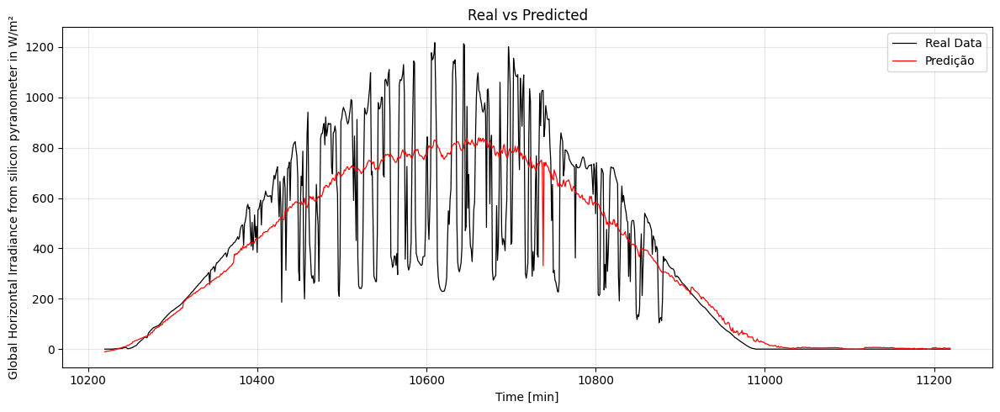

Touba ghi_sil adam 0.0001 :  53.255035400390625 99.01130380542416 0.9069496330049767


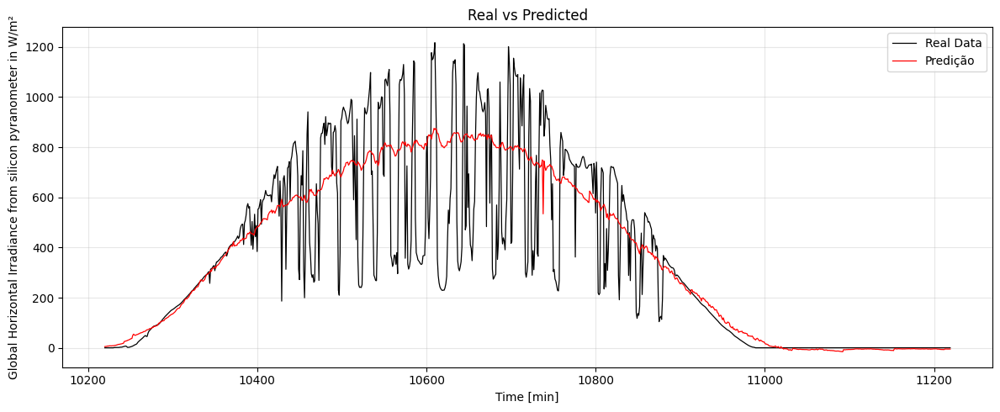

Touba ghi_sil sgd 0.001 :  53.34397506713867 98.87378515372515 0.9090785544204237


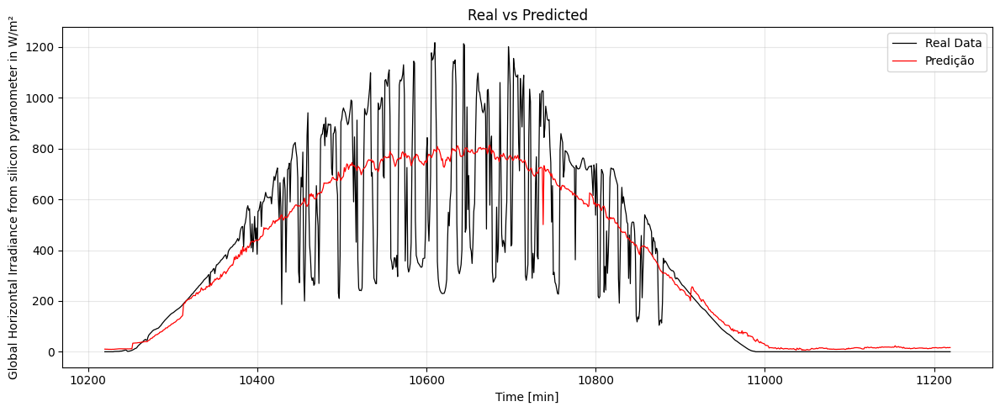

Touba ghi_sil sgd 0.0005 :  52.91503143310547 99.86369127935087 0.9074013287210357


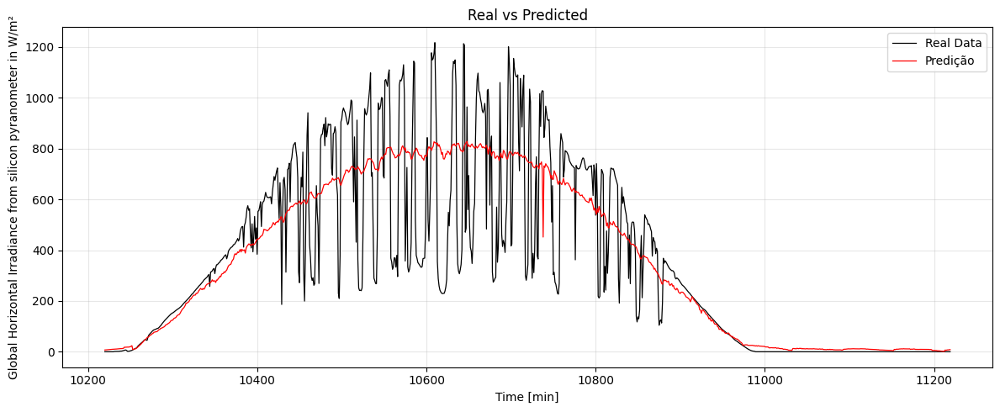

Touba ghi_sil sgd 0.0001 :  67.70720672607422 103.9759587597056 0.8979205547072481


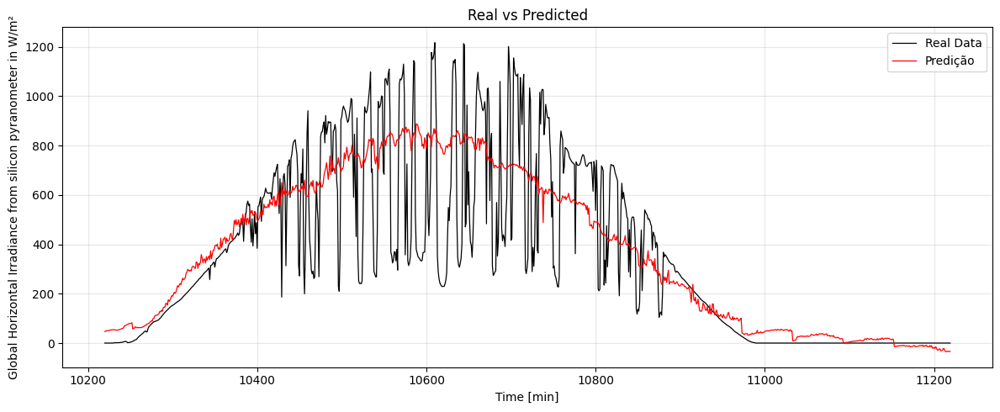

Fatick dhi_rsi adam 0.001 :  34.380897521972656 59.39947480762667 0.8752580166607424


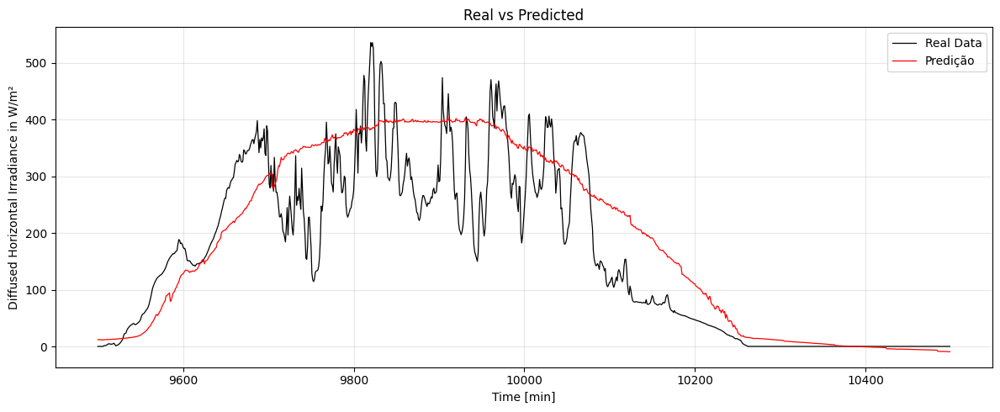

Fatick dhi_rsi adam 0.0005 :  34.7539176940918 60.38881586876207 0.870751081325821


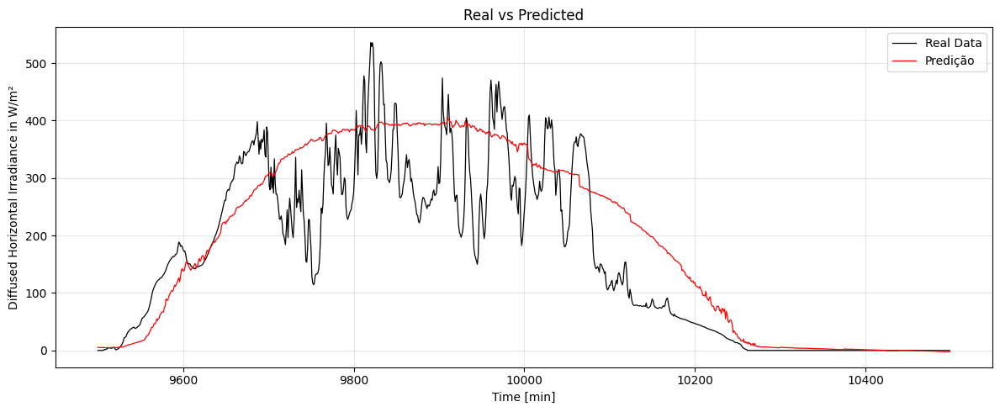

Fatick dhi_rsi adam 0.0001 :  35.34204864501953 61.87117057278677 0.8649647482679917


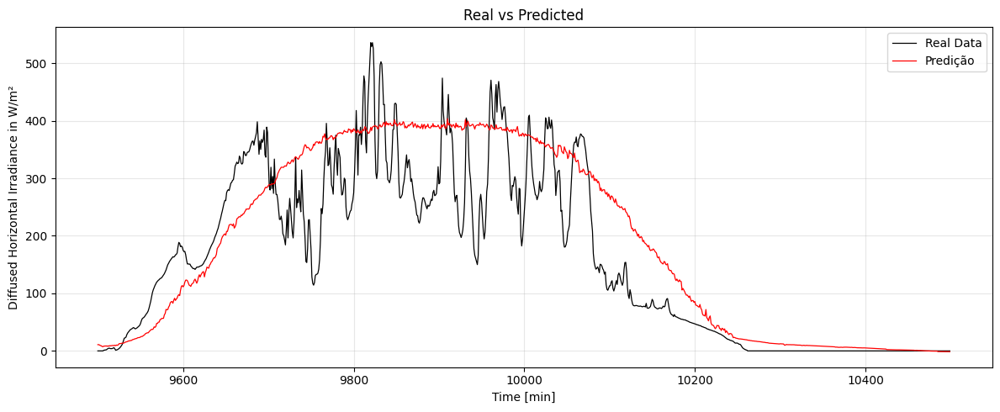

Fatick dhi_rsi sgd 0.001 :  37.74015426635742 63.77299485712487 0.8602296340505932


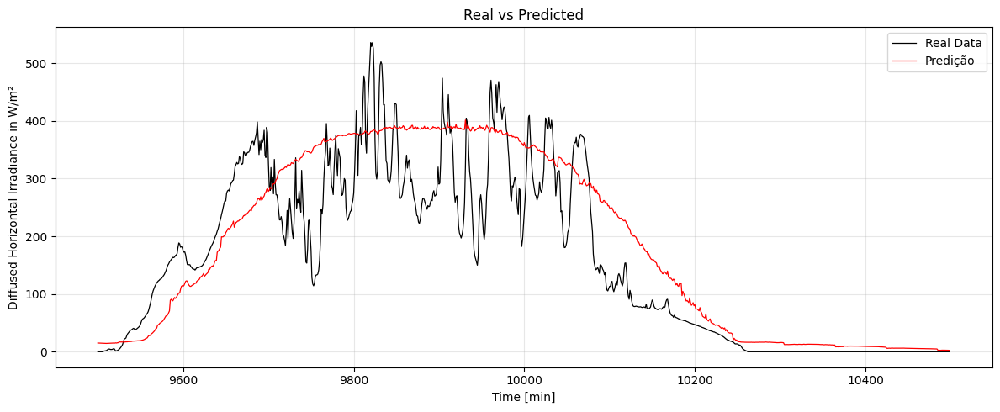

Fatick dhi_rsi sgd 0.0005 :  38.5302848815918 66.7650673537442 0.8492317295435088


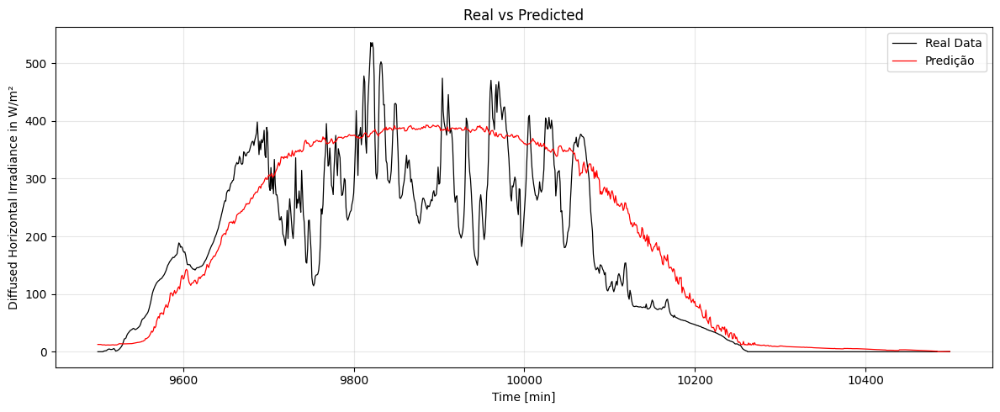

Fatick dhi_rsi sgd 0.0001 :  50.66364669799805 86.32647764265319 0.7650313557010707


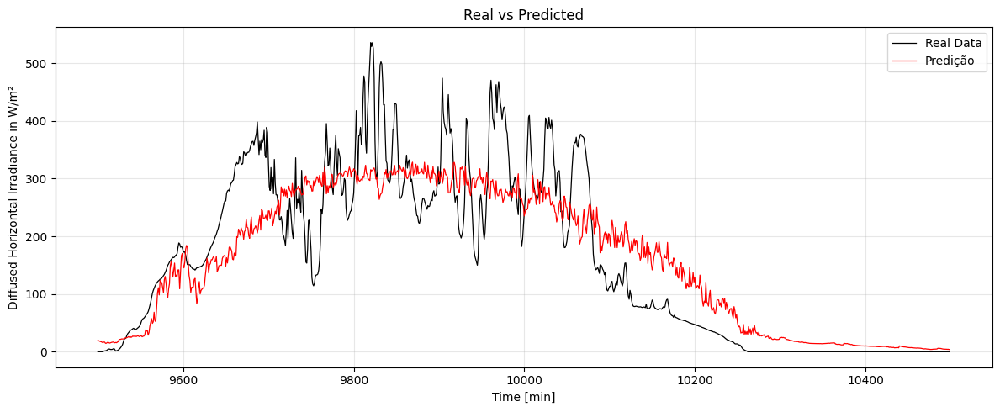

Fatick ghi_pyr adam 0.001 :  62.10795211791992 107.0590566069144 0.9011996551185649


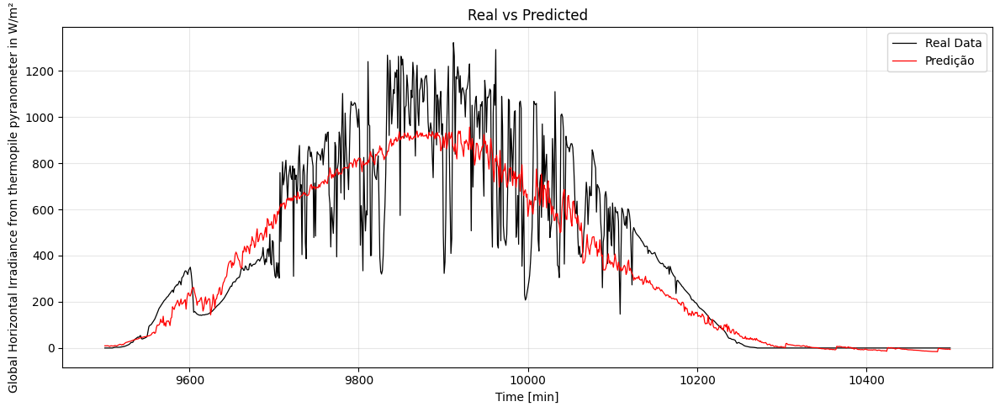

Fatick ghi_pyr adam 0.0005 :  57.68303298950195 105.04725963970931 0.9022086794184874


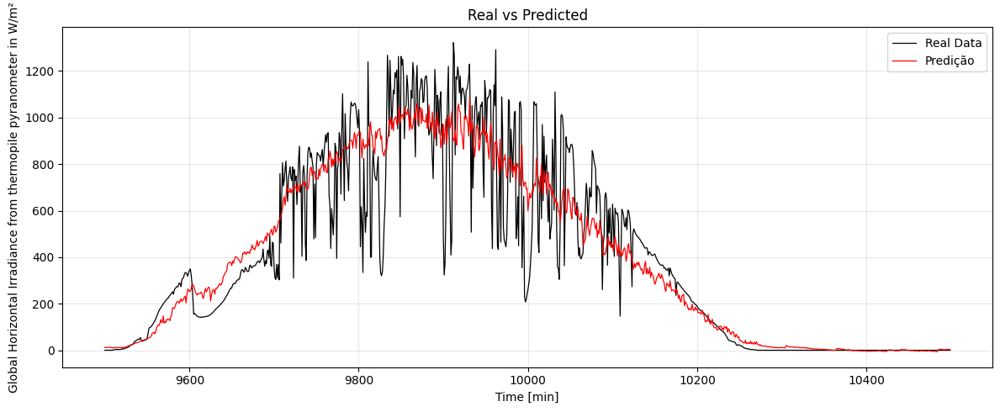

Fatick ghi_pyr adam 0.0001 :  56.17018508911133 104.8665725904828 0.9043700368874943


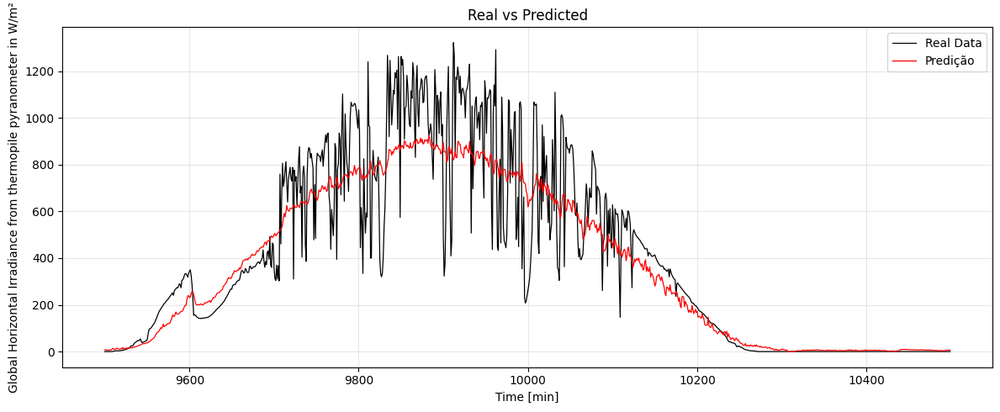

Fatick ghi_pyr sgd 0.001 :  58.709144592285156 104.40652125077006 0.9050805501473383


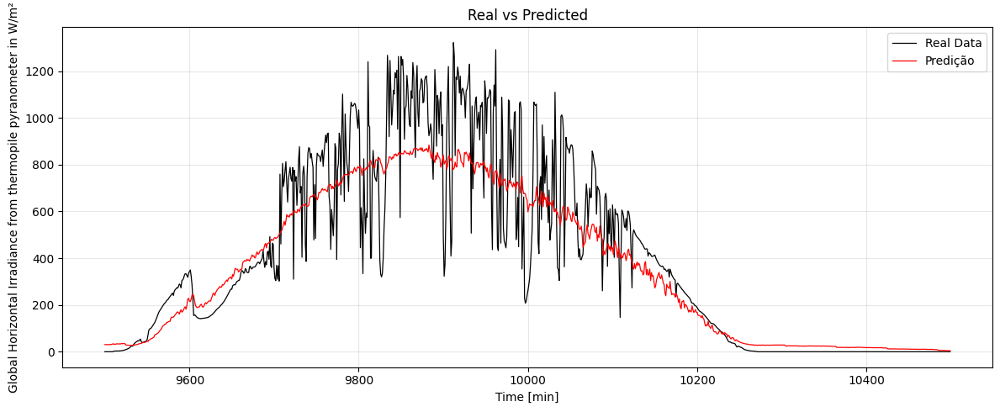

Fatick ghi_pyr sgd 0.0005 :  60.795127868652344 105.61803323917985 0.9020873109039723


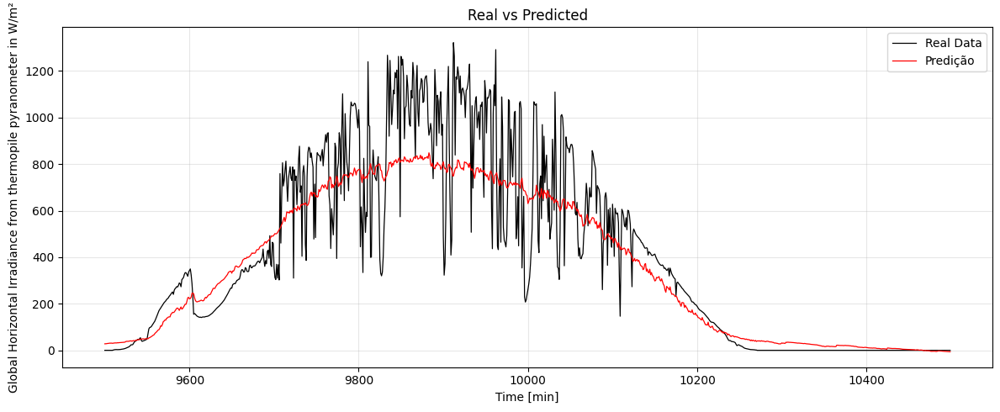

Fatick ghi_pyr sgd 0.0001 :  60.55626678466797 104.52019280084112 0.902596605007402


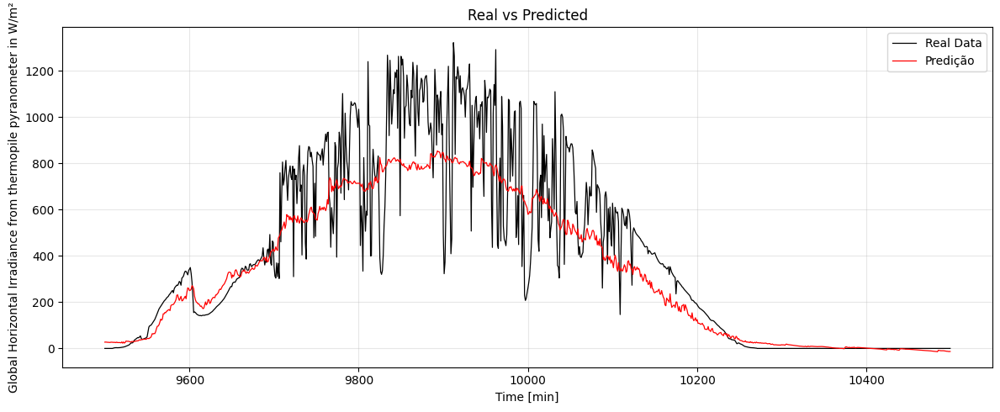

Fatick ghi_sil adam 0.001 :  74.93997192382812 110.66263484121458 0.8948016402335248


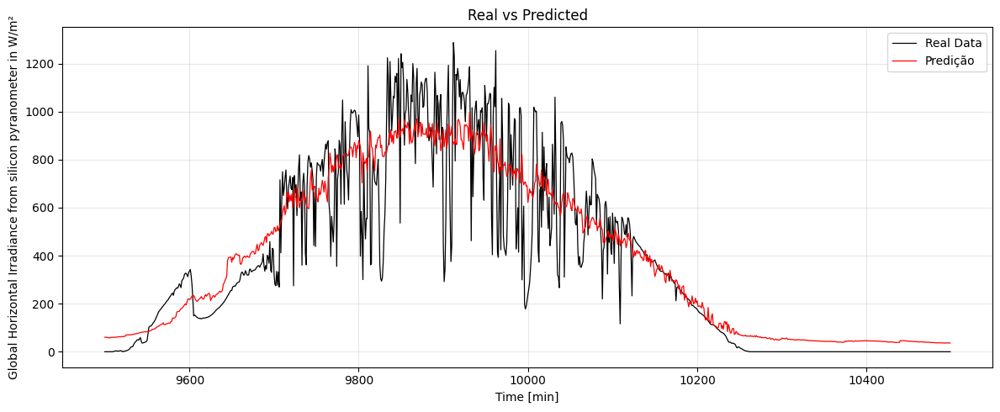

Fatick ghi_sil adam 0.0005 :  66.58280181884766 106.93277860705294 0.8972763604628555


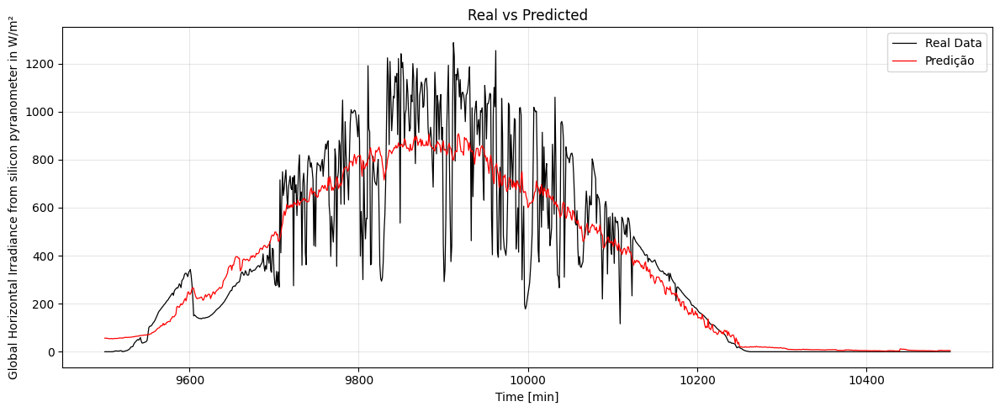

Fatick ghi_sil adam 0.0001 :  63.85948181152344 102.10610768491031 0.9018649069131061


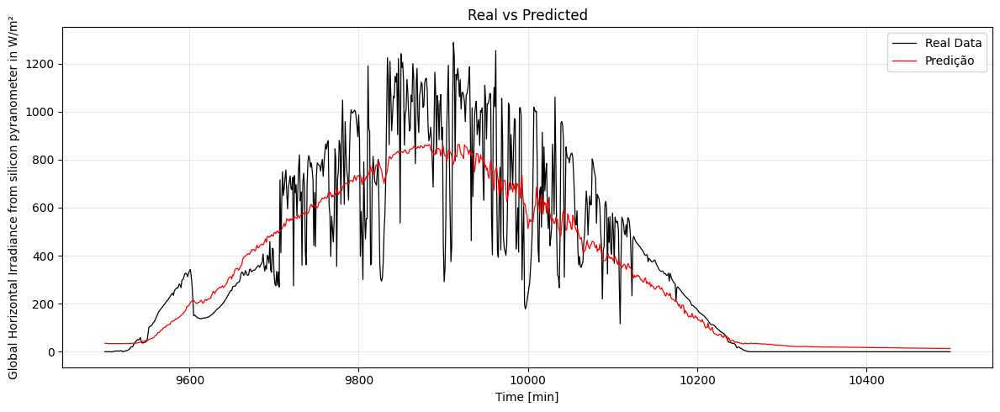

Fatick ghi_sil sgd 0.001 :  64.14550018310547 101.70646047111511 0.9030046283411375


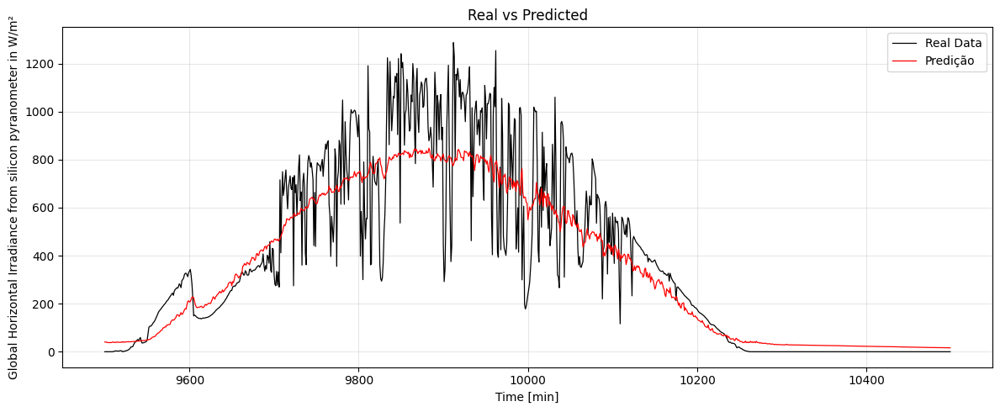

Fatick ghi_sil sgd 0.0005 :  55.583518981933594 99.66352082287932 0.9020201679115811


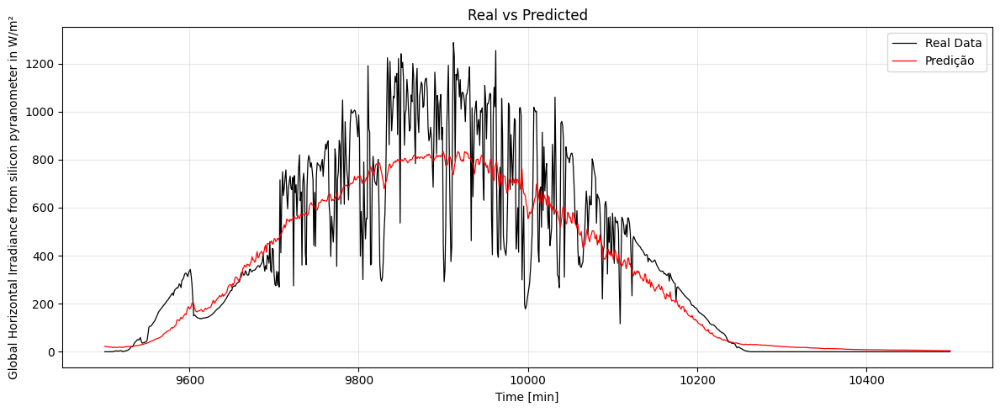

Fatick ghi_sil sgd 0.0001 :  56.895835876464844 102.19942113186111 0.8988486030474533


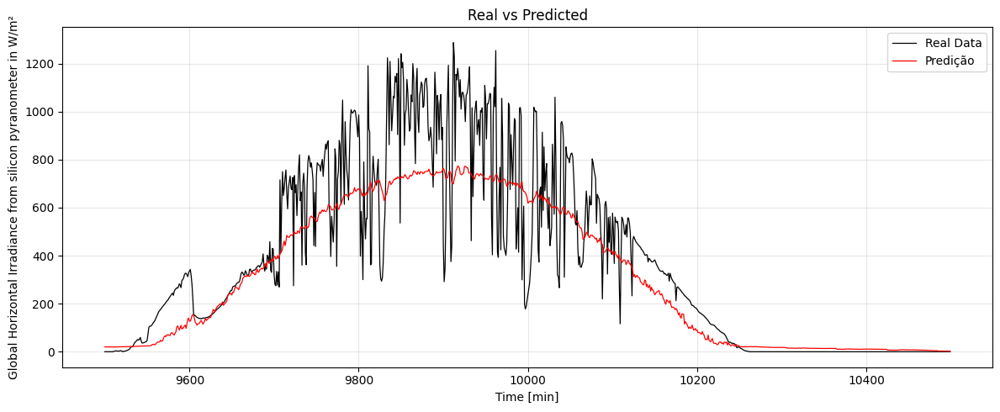

SA Northern Cape GSR adam 0.001 :  69.04476928710938 109.84420341300445 0.8870390819874058


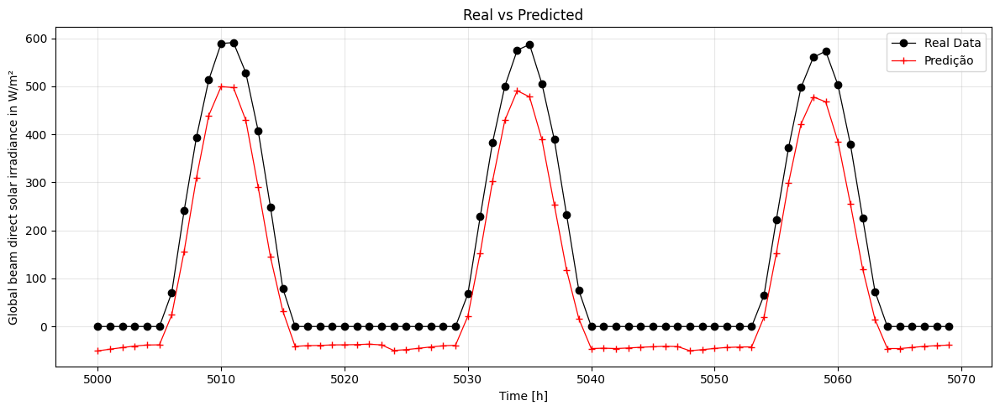

SA Northern Cape GSR adam 0.0005 :  53.3941764831543 103.00145535227888 0.8894322665177599


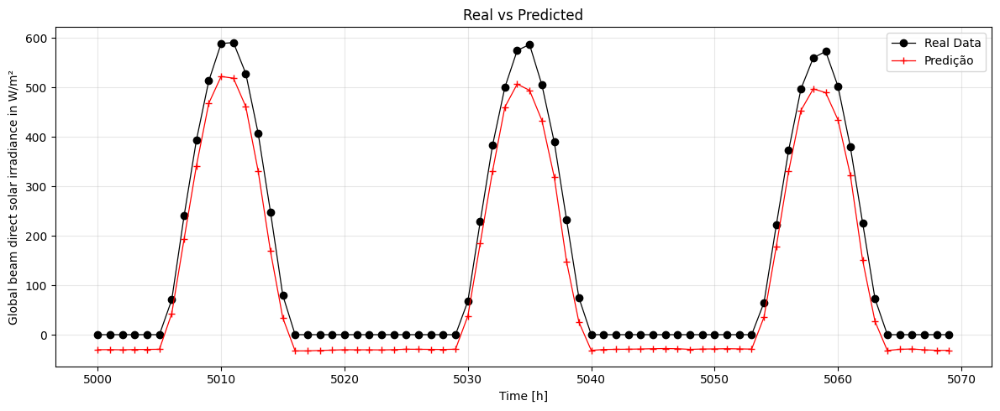

SA Northern Cape GSR adam 0.0001 :  44.25364685058594 101.38382359873788 0.8875018611811948


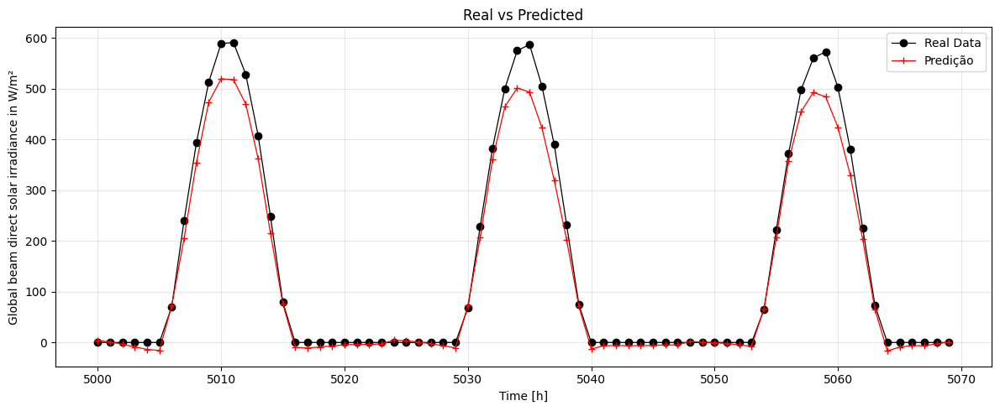

SA Northern Cape GSR sgd 0.001 :  46.852962493896484 101.65551509878841 0.8867703312617314


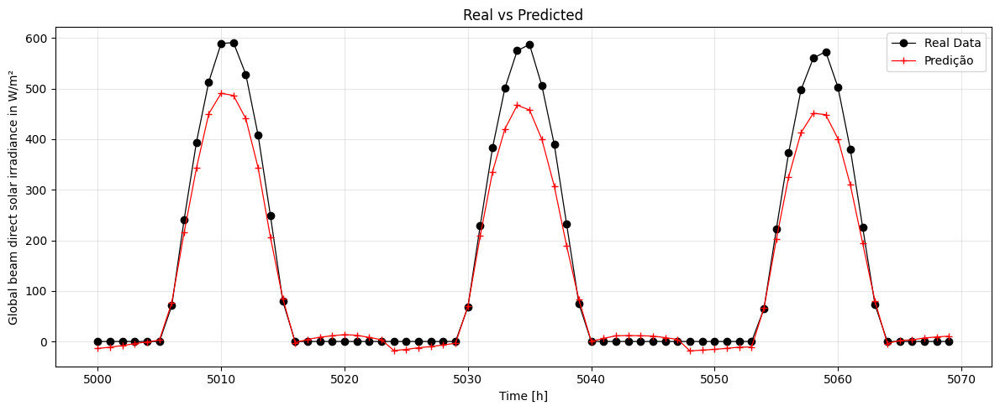

SA Northern Cape GSR sgd 0.0005 :  45.05010223388672 101.91501802206336 0.8860797502703268


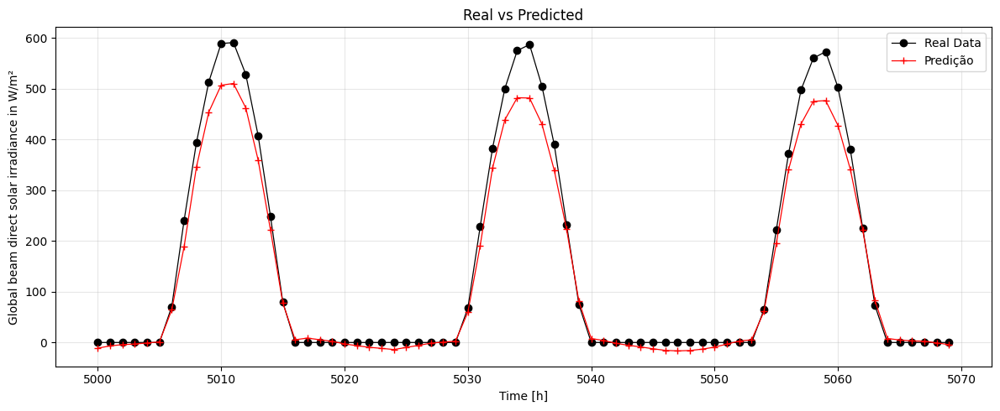

SA Northern Cape GSR sgd 0.0001 :  61.8824577331543 108.65361209768868 0.8711813355884884


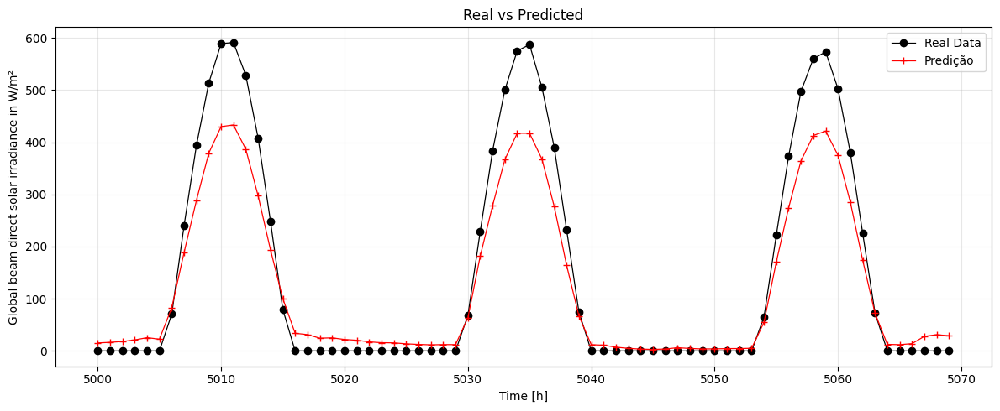

CAR Vakaga GSR adam 0.001 :  44.630863189697266 91.67512271603458 0.8908584394604429


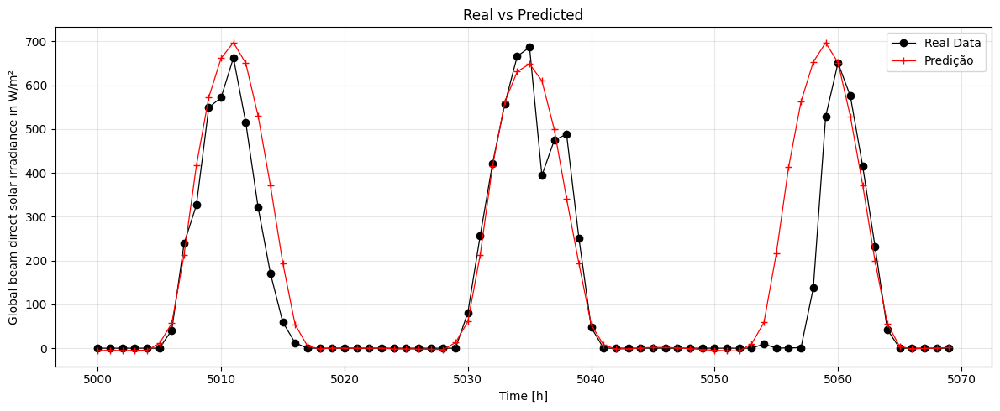

CAR Vakaga GSR adam 0.0005 :  45.28764343261719 91.40938028828059 0.8917068215469143


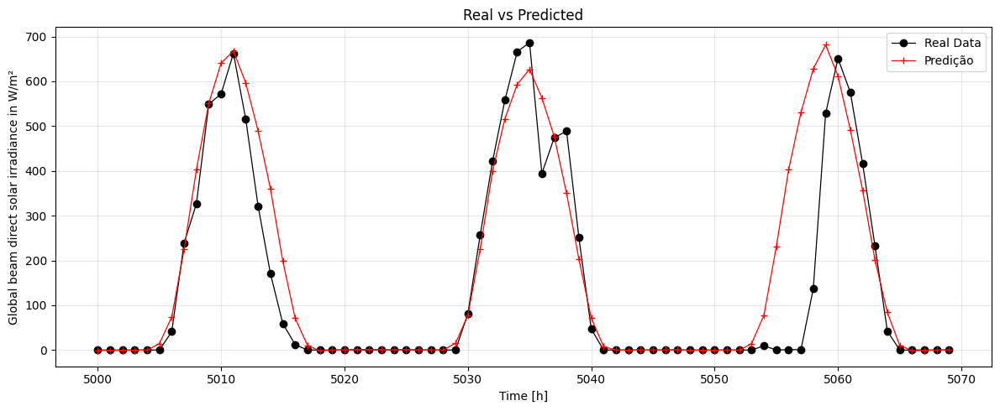

CAR Vakaga GSR adam 0.0001 :  44.96084976196289 88.8068837290007 0.9002632022201853


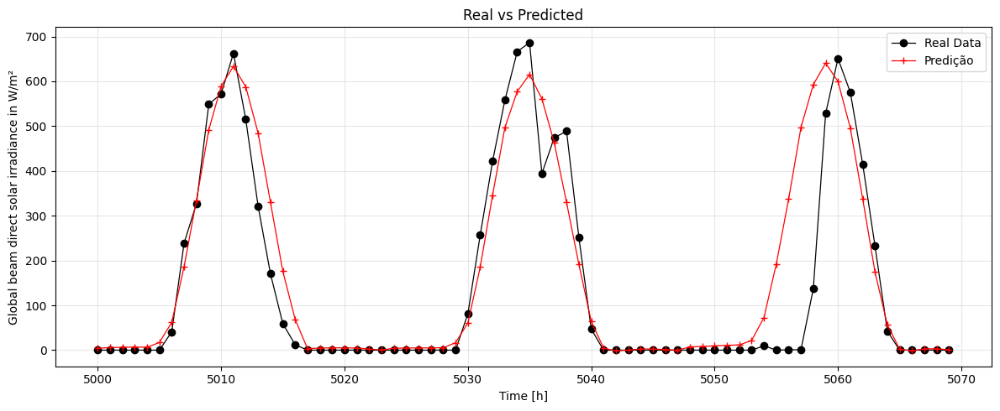

CAR Vakaga GSR sgd 0.001 :  47.72821807861328 90.16213964731122 0.8991460334627567


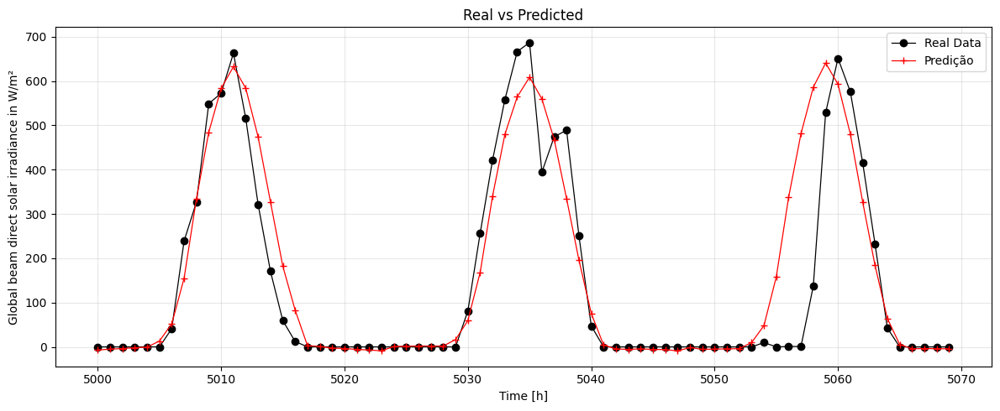

CAR Vakaga GSR sgd 0.0005 :  51.73373794555664 93.44977971148461 0.8898855186529178


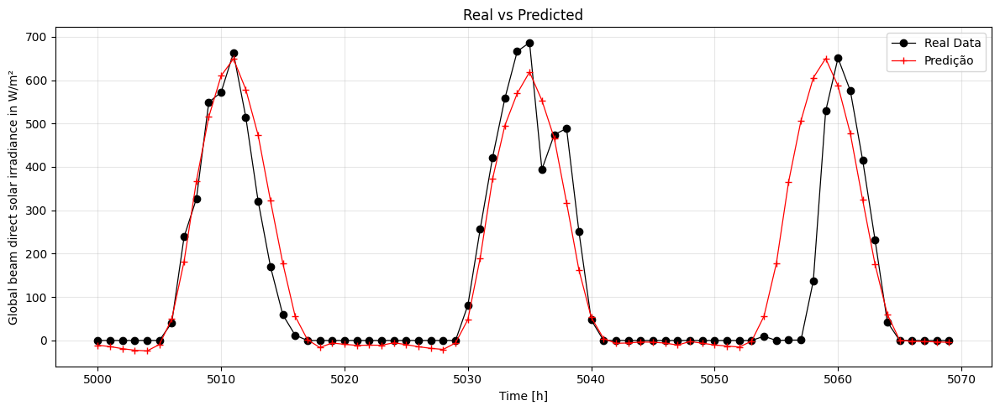

CAR Vakaga GSR sgd 0.0001 :  82.12169647216797 141.74625215503937 0.7577808540073456


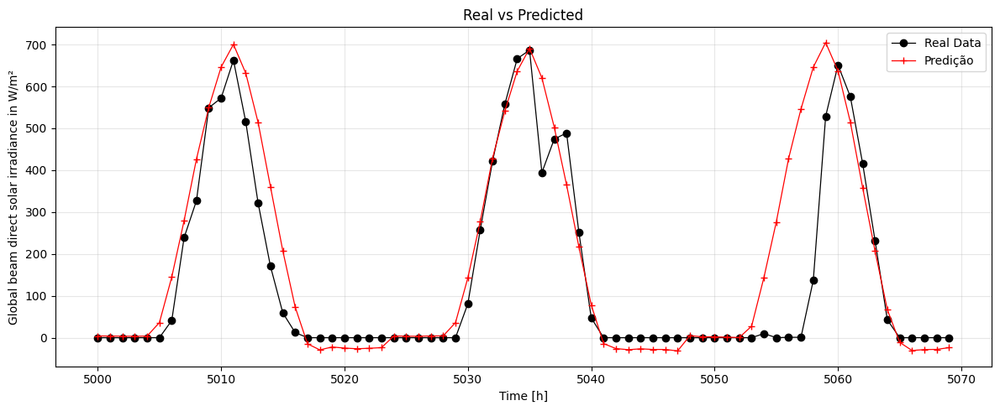

Egypt Mut GSR adam 0.001 :  39.5797004699707 80.76682051978399 0.9369465369692972


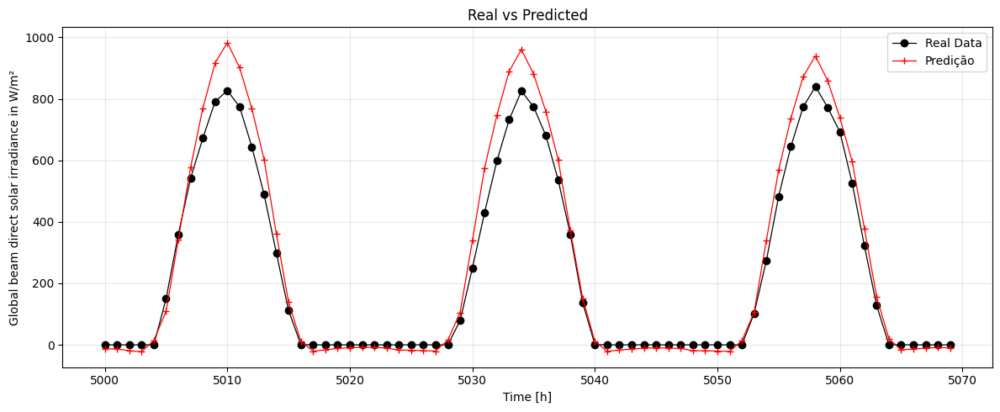

Egypt Mut GSR adam 0.0005 :  41.21475601196289 80.60575715131954 0.9363972414033127


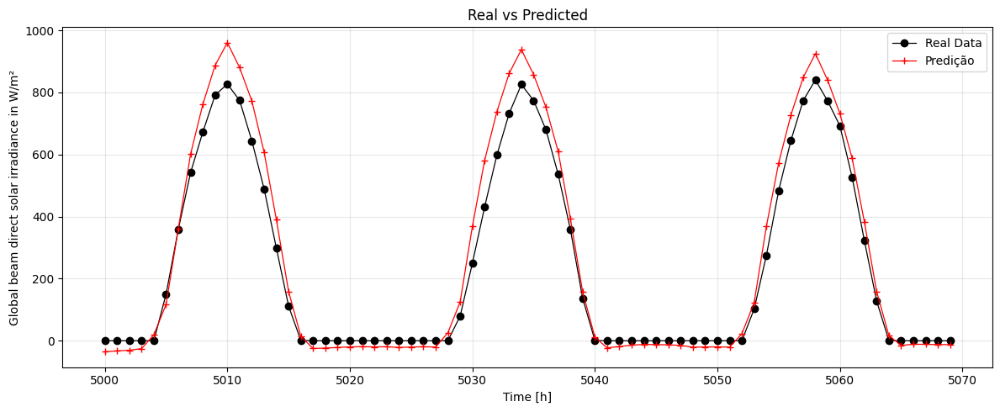

Egypt Mut GSR adam 0.0001 :  34.6618766784668 70.76279767756678 0.946003906159201


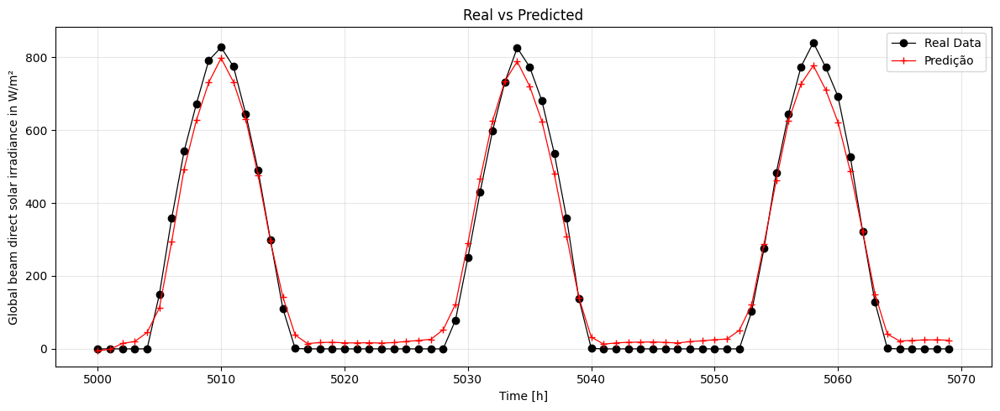

Egypt Mut GSR sgd 0.001 :  37.29010772705078 74.4906532517671 0.9437482519262034


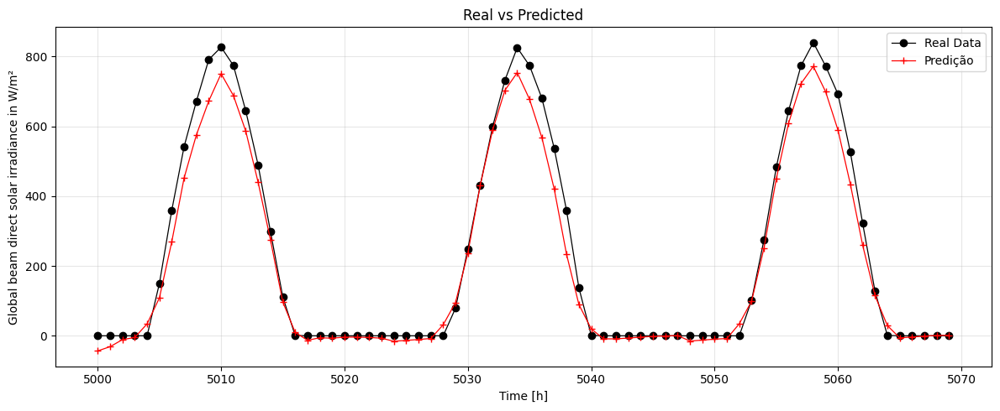

Egypt Mut GSR sgd 0.0005 :  39.89536666870117 76.1894322714361 0.9387238314443442


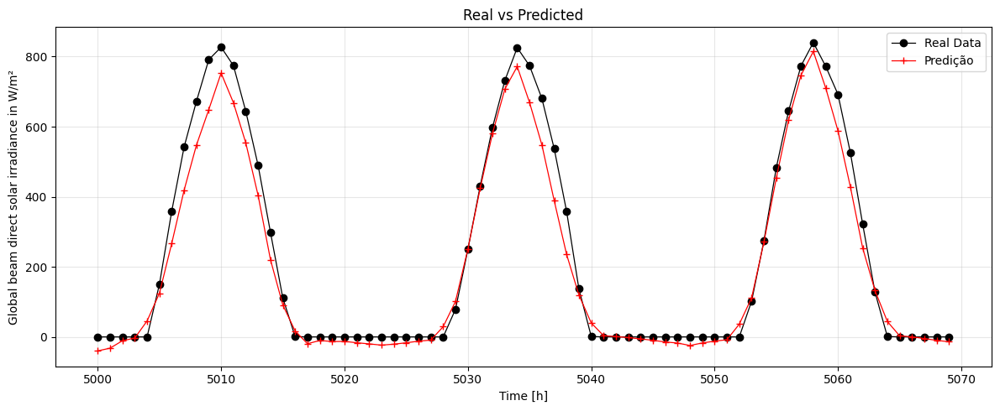

Egypt Mut GSR sgd 0.0001 :  60.97013854980469 94.06326826928778 0.9062276976516327


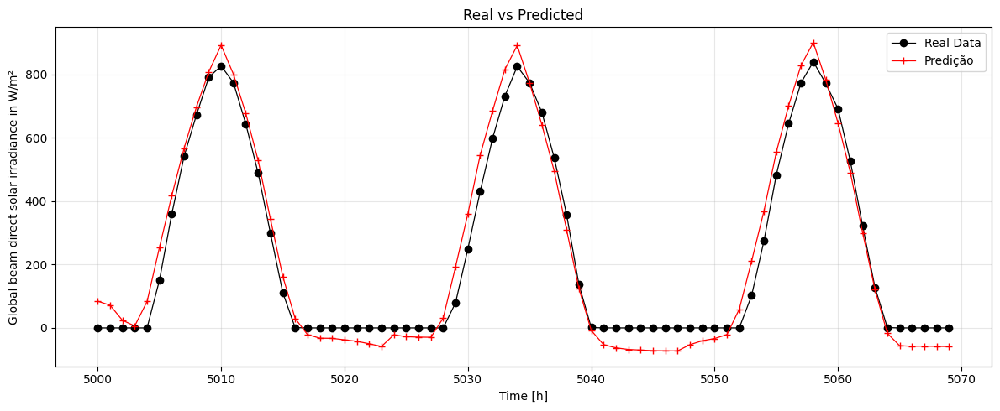

Algeria Tamanrasset GSR adam 0.001 :  57.73682403564453 119.00282707382418 0.8449317543313163


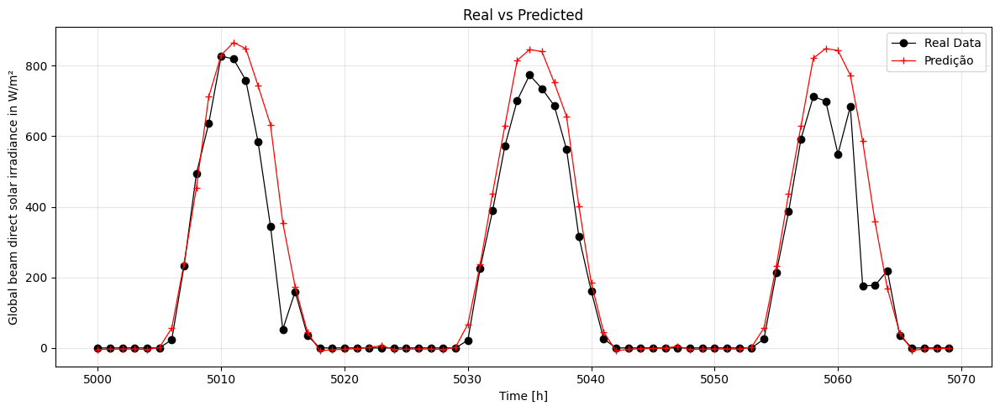

Algeria Tamanrasset GSR adam 0.0005 :  48.815757751464844 102.65025667436248 0.8827808181780141


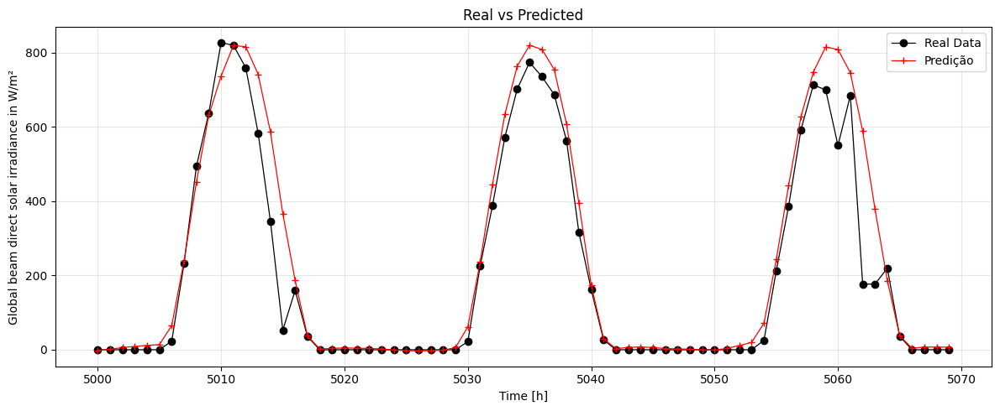

Algeria Tamanrasset GSR adam 0.0001 :  47.43360900878906 96.09705786989527 0.8987539409409455


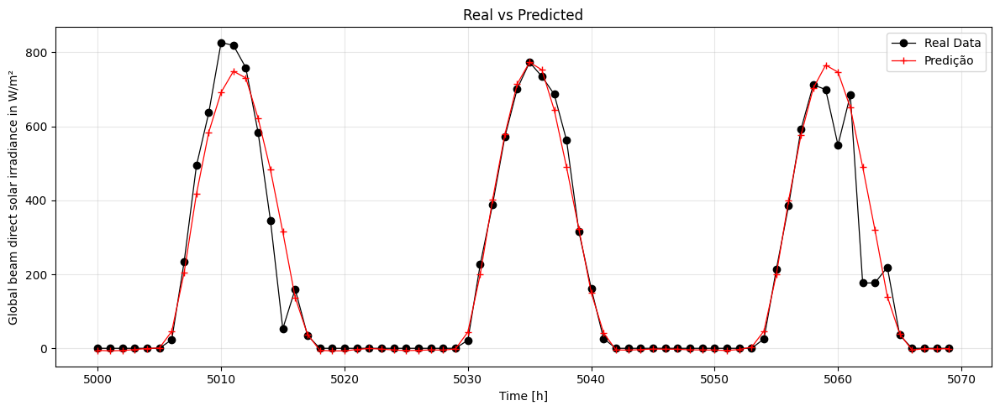

Algeria Tamanrasset GSR sgd 0.001 :  47.258079528808594 95.39715502833404 0.8999440454485069


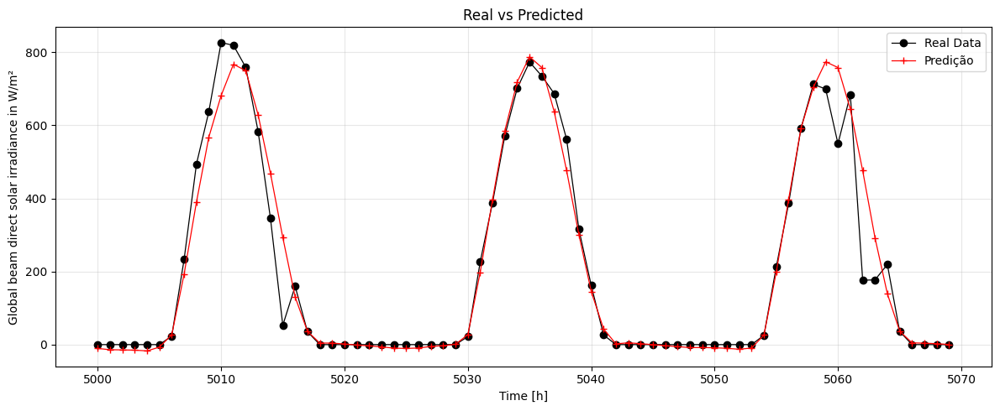

Algeria Tamanrasset GSR sgd 0.0005 :  47.478416442871094 96.27181672386006 0.8968632248133326


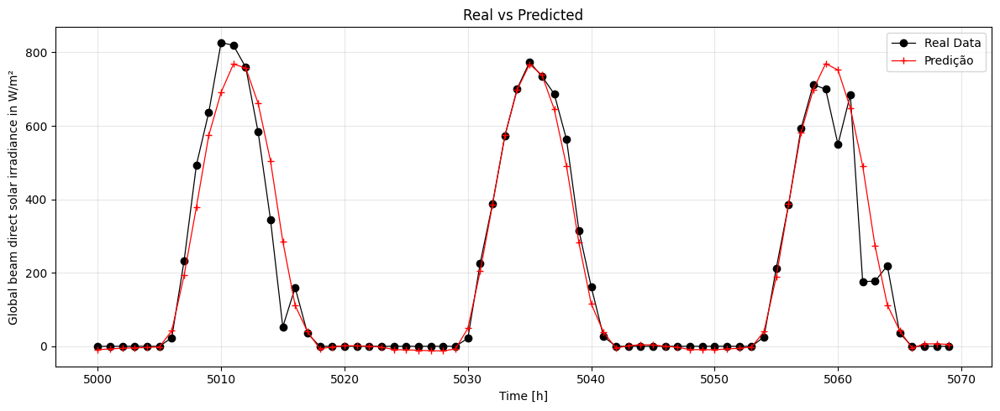

Algeria Tamanrasset GSR sgd 0.0001 :  53.08465576171875 101.45651200452832 0.8856427551343868


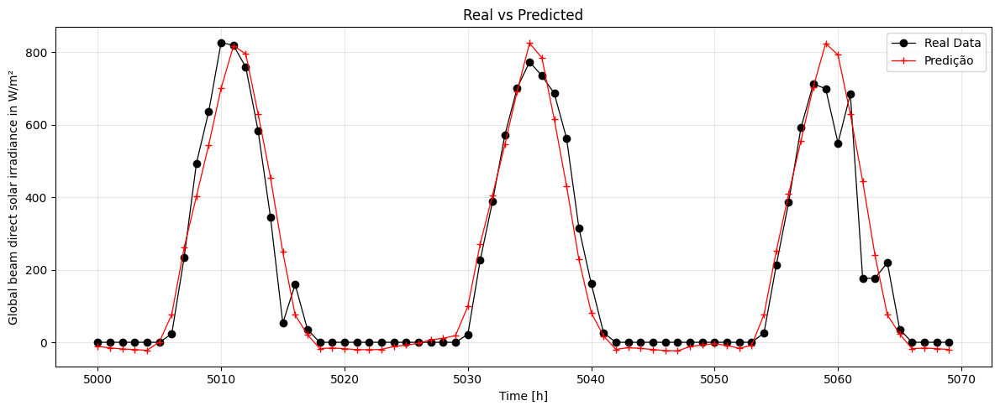

Nigeria Borno DSR adam 0.001 :  19.897724151611328 35.96430386291037 0.8952034039600358


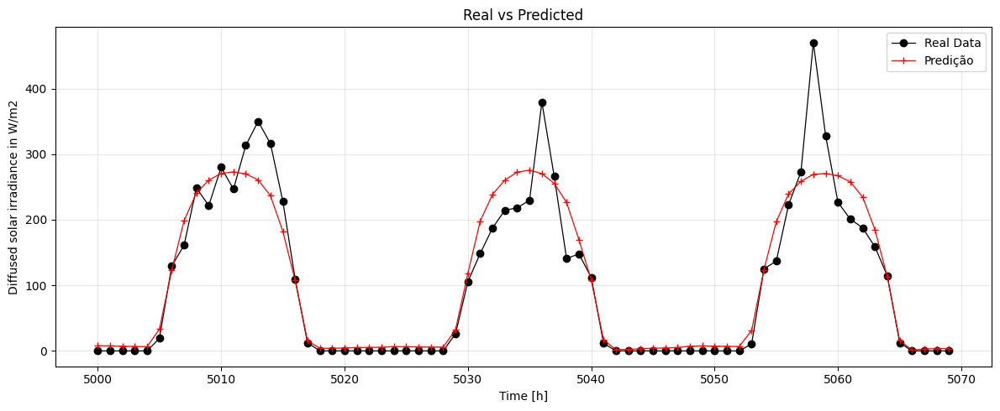

Nigeria Borno DSR adam 0.0005 :  17.66368293762207 35.166923726906546 0.8951691548981696


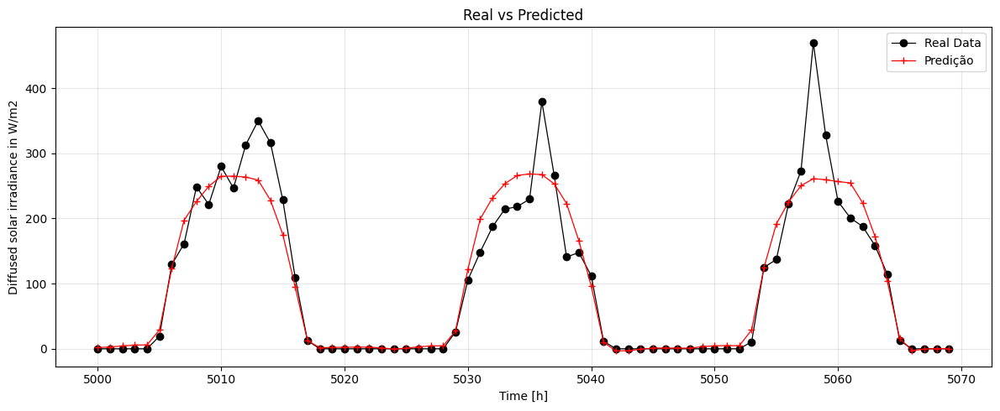

Nigeria Borno DSR adam 0.0001 :  17.060894012451172 35.22995225845207 0.8927918501361912


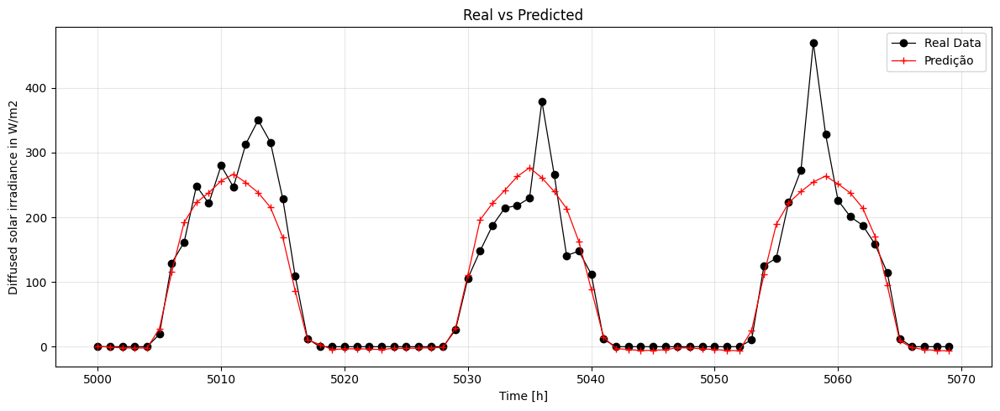

Nigeria Borno DSR sgd 0.001 :  17.970136642456055 35.557783353736355 0.8907761269595624


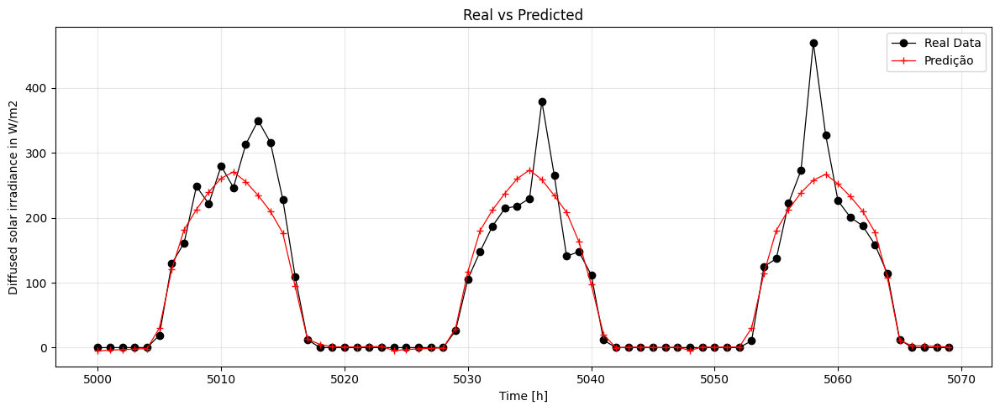

Nigeria Borno DSR sgd 0.0005 :  18.635780334472656 35.74280651786367 0.889720545072406


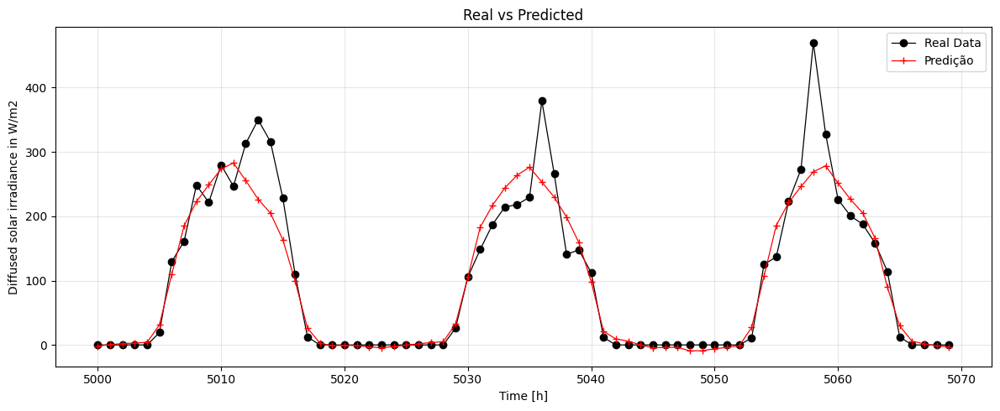

Nigeria Borno DSR sgd 0.0001 :  20.56137466430664 36.94980495127816 0.8820992241629119


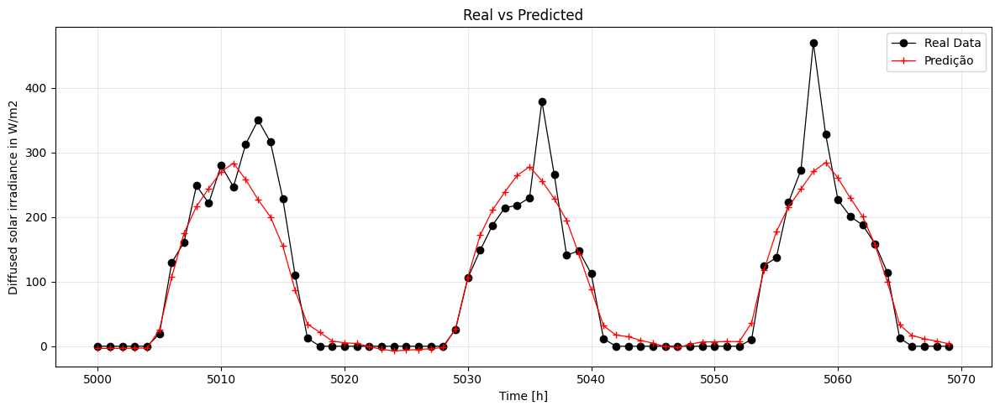

Nigeria Abuja DNI adam 0.001 :  34.182579040527344 50.262635421665365 0.7518264616057233


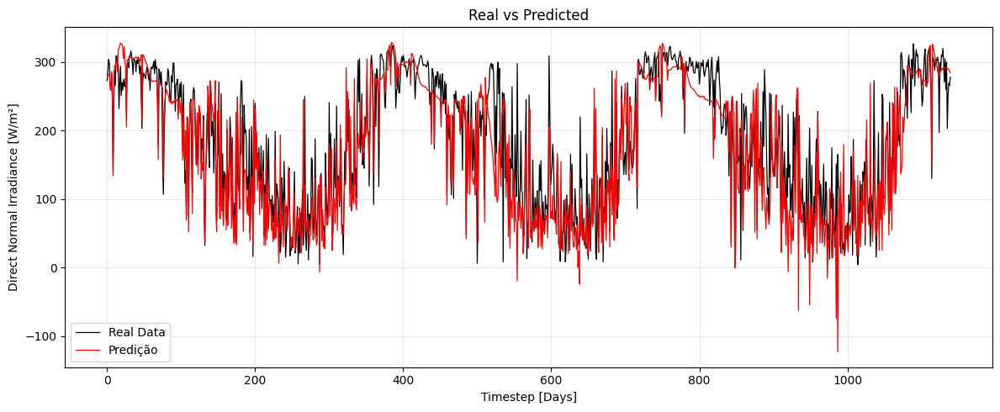

Nigeria Abuja DNI adam 0.0005 :  29.451873779296875 41.99817617180313 0.8038768285809161


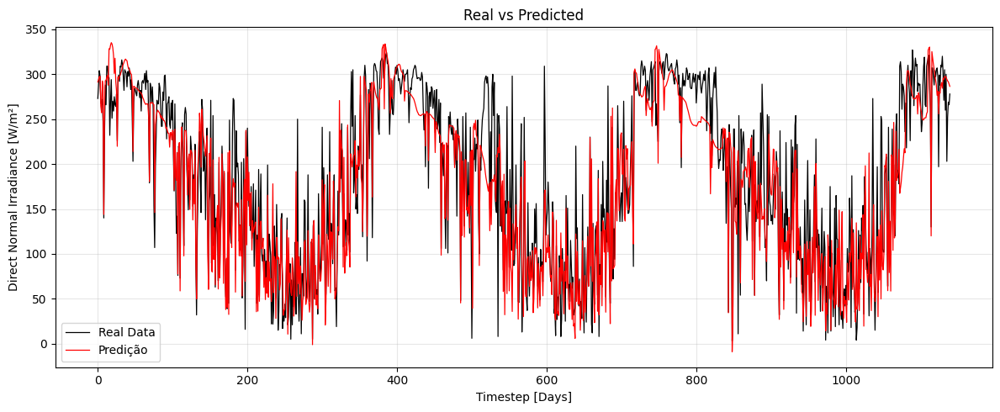

Nigeria Abuja DNI adam 0.0001 :  24.135059356689453 35.24127565463011 0.8545416301593713


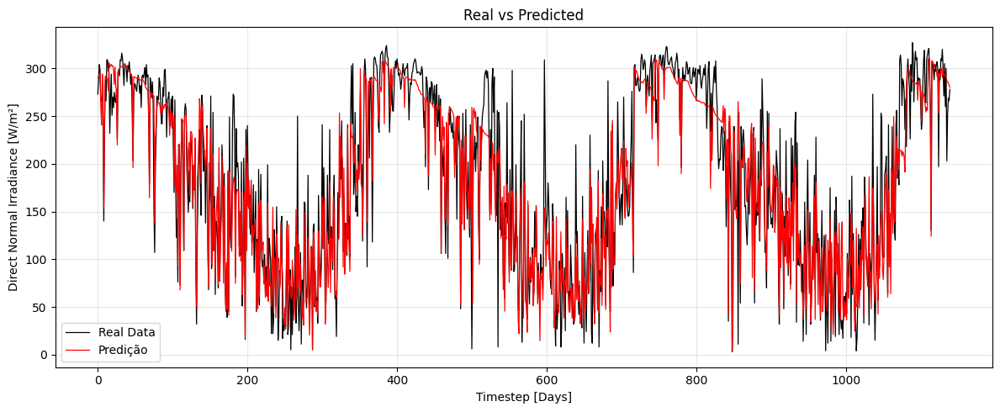

Nigeria Abuja DNI sgd 0.001 :  24.277896881103516 35.2747534015344 0.8533046081247442


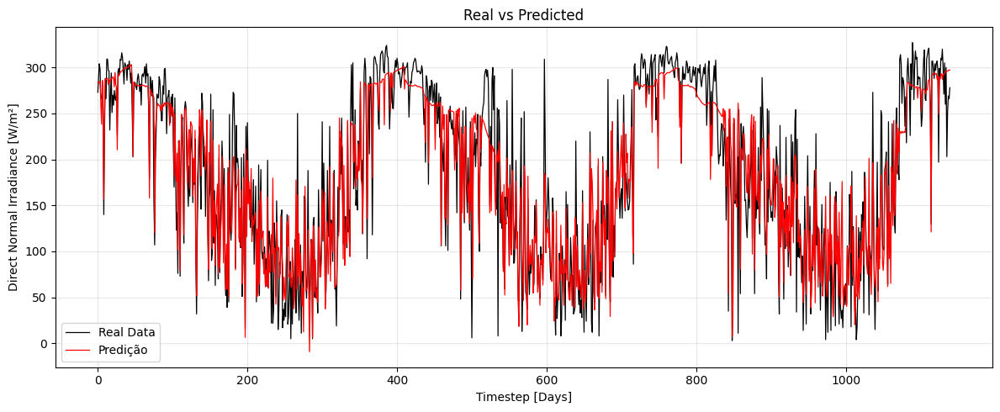

Nigeria Abuja DNI sgd 0.0005 :  25.35967254638672 36.01544875228025 0.8489828453026863


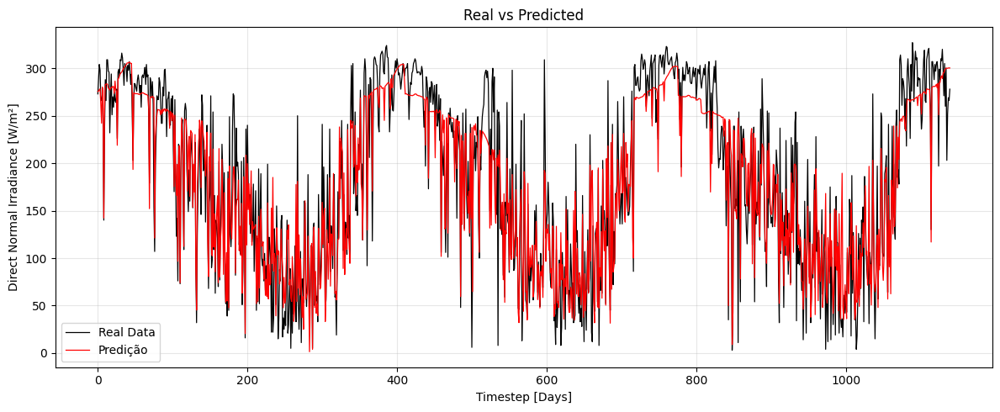

Nigeria Abuja DNI sgd 0.0001 :  31.079458236694336 44.40202054761627 0.7741395483472564


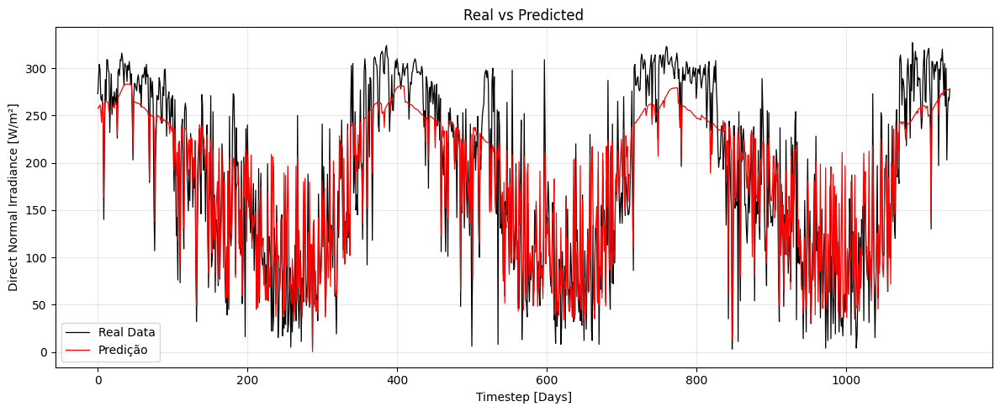

Nigeria Akure DNI adam 0.001 :  33.26698303222656 48.730850605968804 0.6516681832216903


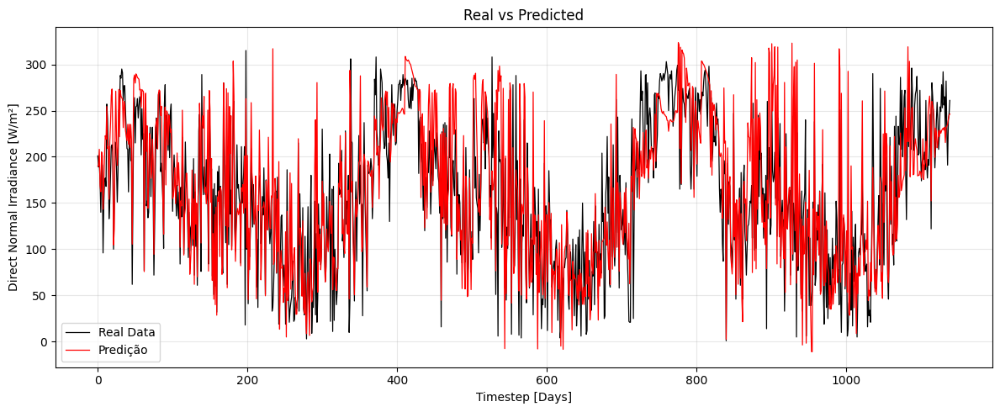

Nigeria Akure DNI adam 0.0005 :  28.34029769897461 39.91630036910047 0.7418911720938226


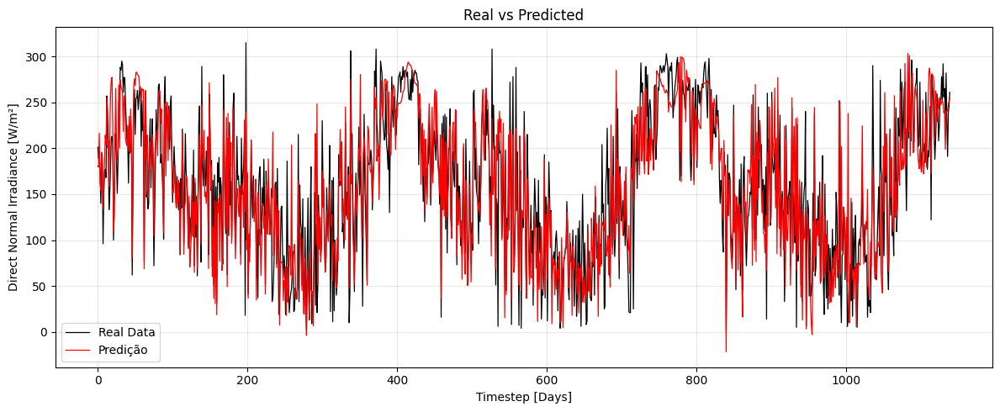

Nigeria Akure DNI adam 0.0001 :  27.420835494995117 37.079456689633915 0.7692120653192395


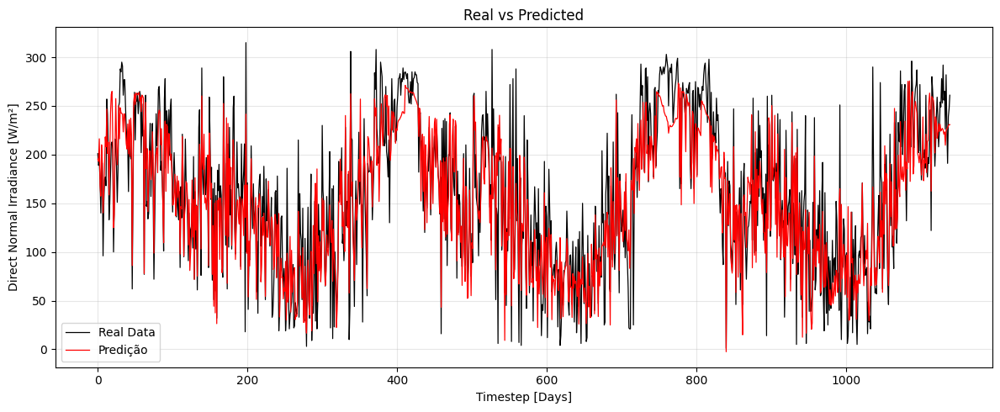

Nigeria Akure DNI sgd 0.001 :  27.369157791137695 36.87368906568069 0.7773695807761175


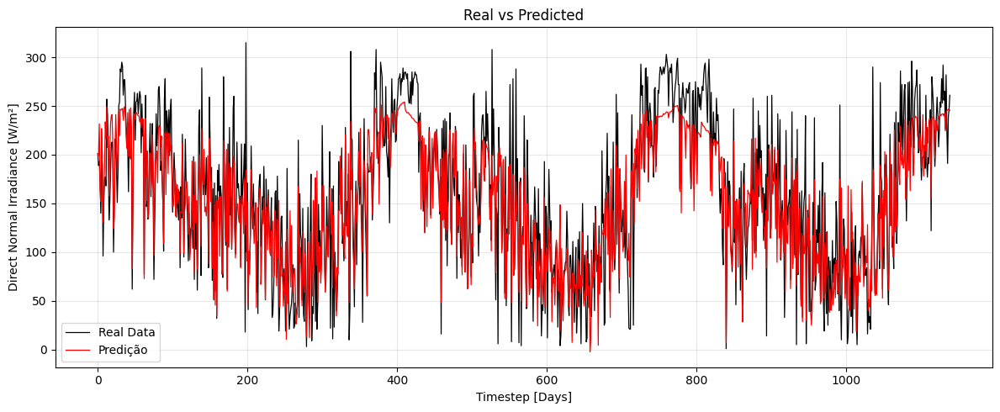

Nigeria Akure DNI sgd 0.0005 :  27.505130767822266 37.876426141157545 0.7627593340996508


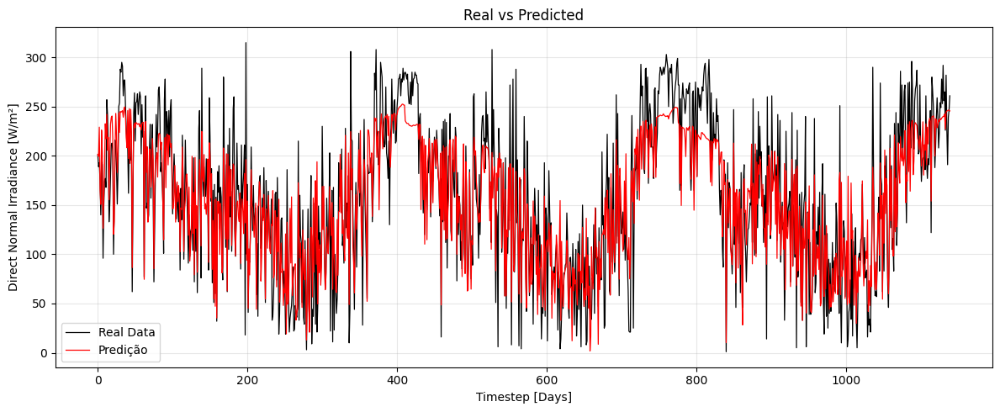

Nigeria Akure DNI sgd 0.0001 :  33.14095687866211 45.18964487475256 0.6659349468202791


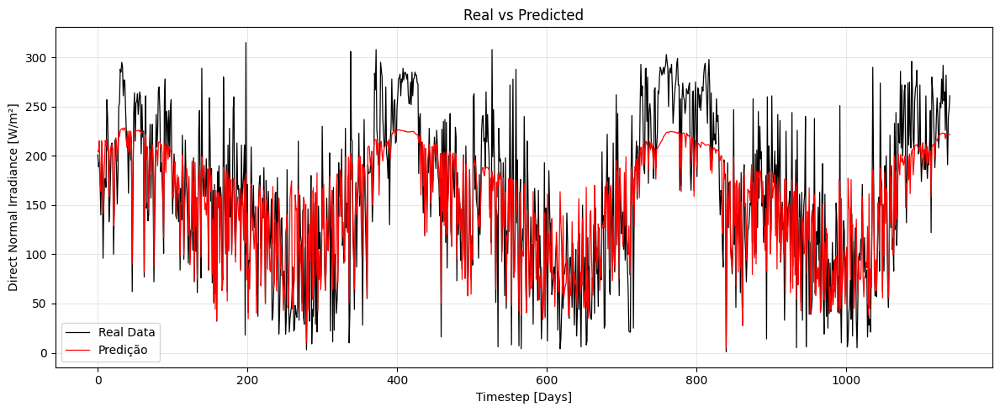

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

metricas = []

for md in models_data:
  for opt_name in OTIMIZADORES:
    for lr in LRS:

      caminho = f"output/{md['cidade']}_{md['target']}_{opt_name}_{lr}.pth"

      if not os.path.exists(caminho):
        print(f"Modelo não encontrado: {caminho}")
        continue

      model = Model(
          num_features=md["qnt_features"],
          num_outputs=1,
          neurons=md["params"]["neurons"],
          dropouts=md["params"]["dropouts"]
      )

      model.load_state_dict(torch.load(caminho))
      model.eval()

      preds, reals = [], []

      with torch.no_grad():
          for Xb, yb in md["test_loader"]:
              pred = model(Xb).cpu().numpy().reshape(-1)
              preds.append(pred)
              reals.append(yb.cpu().numpy().reshape(-1))

      preds = np.concatenate(preds).reshape(-1, 1)
      reals = np.concatenate(reals).reshape(-1, 1)

      # DESNORMALIZAÇÃO AQUI
      scaler_y = md["scaler_y"]
      preds = scaler_y.inverse_transform(preds).reshape(-1)
      reals = scaler_y.inverse_transform(reals).reshape(-1)

      # print("NaNs reals:", np.isnan(reals).any())
      # print("NaNs preds:", np.isnan(preds).any())
      # print("std reals:", np.std(reals))
      # print("std preds:", np.std(preds))

      mae = mean_absolute_error(reals, preds)
      rmse = np.sqrt(mean_squared_error(reals, preds))
      #r = np.corrcoef(reals, preds)[0,1] ** 2
      r = np.corrcoef(reals.reshape(-1), preds.reshape(-1))[0, 1] ** 2

      print(md["cidade"], md["target"], opt_name, lr, ": ", mae, rmse, r)

      metricas.append({
          "cidade": md["cidade"],
          "target": md["target"],
          "optimizer": opt_name,
          "lr": lr,
          "MAE": mae,
          "RMSE": rmse,
          "R": r
      })

      dataset_type = md['tipo']
      target = md['target']

      if dataset_type == 'wb':
        s, f = 9_500, 10_500

        if md['cidade'] == 'Touba':
          s += 720
          f += 720

        reals = reals[s: f]
        preds = preds[s: f]
        intervalo = list(range(s, f))
        xlabel = 'Time [min]'
        marker = False

        if target == 'dhi_rsi':
          ylabel = 'Diffused Horizontal Irradiance in W/m²'
        elif target == 'ghi_pyr':
          ylabel = 'Global Horizontal Irradiance from thermopile pyranometer in W/m²'
        elif target == 'ghi_sil':
          ylabel = 'Global Horizontal Irradiance from silicon pyranometer in W/m²'

      elif dataset_type == 'tmy':
        s, f = 5000, 5070
        reals = reals[s:f]
        preds = preds[s:f]
        intervalo = list(range(s, f))
        xlabel = 'Time [h]'
        marker = True

        if target == 'GSR':
          ylabel = 'Global beam direct solar irradiance in W/m²'
        elif target == 'DSR':
          ylabel = 'Diffused solar irradiance in W/m2'

      elif dataset_type == 'sarah':
        s, f = 0, 1_140
        reals = reals[s:f]
        preds = preds[s:f]
        intervalo = list(range(s, f))
        xlabel = 'Timestep [Days]'
        marker = False

        ylabel = 'Direct Normal Irradiance [W/m²]'



      criar_plot(reals, preds, intervalo, xlabel, ylabel, marker, md, opt_name, lr)


In [ ]:
df_metricas = pd.DataFrame(metricas)
df_metricas.to_csv("metricas_modelos.csv", index=False)

In [ ]:
import shutil
from google.colab import files

# shutil.make_archive("output_plots", "zip", "output_plots")
# files.download("output_plots.zip")

# shutil.make_archive("output", "zip", "output")
# files.download("output.zip")

files.download('metricas_modelos.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pandas as pd
from openpyxl import load_workbook
from openpyxl.utils import get_column_letter


df_metricas.to_excel("resultado_formatado.xlsx", index=False)

wb = load_workbook("resultado_formatado.xlsx")
ws = wb.active

# Mescla Touba (linhas 2–4)
ws.merge_cells("A2:A4")

# Mescla Fatick (linhas 5–7)
ws.merge_cells("A5:A7")

wb.save("resultado_formatado.xlsx")
files.download('resultado_formatado.xlsx')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!unzip output.zip -d output

Archive:  output.zip
  inflating: output/Fatick_dhi_rsi_sgd_0.001.pth  
  inflating: output/Touba_ghi_sil_sgd_0.0001.pth  
  inflating: output/Nigeria Borno_DSR_adam_0.001.pth  
  inflating: output/SA Northern Cape_GSR_sgd_0.0001.pth  
  inflating: output/Nigeria Akure_DNI_adam_0.001.pth  
  inflating: output/Touba_dhi_rsi_sgd_0.0005.pth  
  inflating: output/SA Northern Cape_GSR_adam_0.0005.pth  
  inflating: output/Nigeria Abuja_DNI_sgd_0.0005.pth  
  inflating: output/Nigeria Abuja_DNI_sgd_0.001.pth  
  inflating: output/Touba_ghi_pyr_adam_0.001.pth  
  inflating: output/Nigeria Abuja_DNI_adam_0.0001.pth  
  inflating: output/Egypt Mut_GSR_adam_0.0005.pth  
  inflating: output/CAR Vakaga_GSR_adam_0.0005.pth  
  inflating: output/Touba_dhi_rsi_sgd_0.001.pth  
  inflating: output/Algeria Tamanrasset_GSR_sgd_0.0001.pth  
  inflating: output/Fatick_ghi_sil_adam_0.001.pth  
  inflating: output/Fatick_ghi_pyr_sgd_0.0005.pth  
  inflating: output/Nigeria Abuja_DNI_adam_0.0005.pth  
  infla